# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of lstm time series forecasting

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [7]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [9]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [10]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [11]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

# Perform train test split for dataset

In [12]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [13]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Build GRU model

In [14]:
gru_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.GRU(50, dropout=0.2, recurrent_dropout=0.2, input_shape=(train_X.shape[1], train_X.shape[2])),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [15]:
gru_model.compile(loss='mae', optimizer='adam')

# Train model

In [16]:
history = gru_model.fit(train_X, train_y, epochs=1000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/1000
10/10 - 1s - loss: 81.1943 - val_loss: 73.4874
Epoch 2/1000
10/10 - 1s - loss: 79.4413 - val_loss: 72.7050
Epoch 3/1000
10/10 - 1s - loss: 77.9117 - val_loss: 71.9176
Epoch 4/1000
10/10 - 0s - loss: 75.9382 - val_loss: 71.0840
Epoch 5/1000
10/10 - 0s - loss: 73.9006 - val_loss: 69.8384
Epoch 6/1000
10/10 - 0s - loss: 70.8957 - val_loss: 68.6442
Epoch 7/1000
10/10 - 1s - loss: 67.6818 - val_loss: 66.7385
Epoch 8/1000
10/10 - 1s - loss: 63.4210 - val_loss: 64.8568
Epoch 9/1000
10/10 - 1s - loss: 59.1633 - val_loss: 62.5746
Epoch 10/1000


KeyboardInterrupt: 

# Plot model loss and validation loss

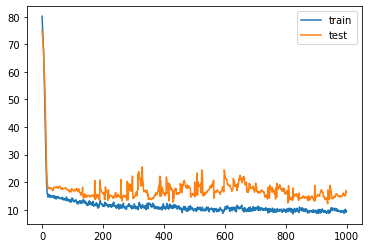

In [17]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [18]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = gru_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [19]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 18.464955332966834


# Make predictions based on test set and get a root mean squared error 

In [20]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = gru_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [21]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 19.935865505132533


# Plot train labels along with train predictions

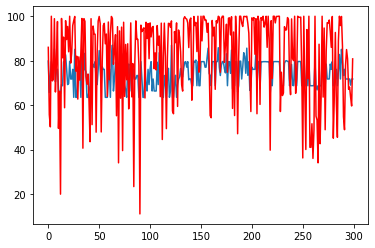

In [22]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

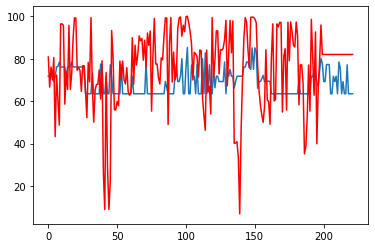

In [23]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [24]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [25]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [26]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [27]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [28]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [29]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [30]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [31]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [32]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [33]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [34]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [35]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [36]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 6)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 6)
Shape of test_y: (222,)


# Build gru model

In [37]:
gru_norm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.GRU(50, dropout=0.2, recurrent_dropout=0.2, input_shape=(train_X.shape[1], train_X.shape[2])),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [38]:
from tensorflow import keras

gru_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [39]:
history = gru_norm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 1s - loss: 0.5478 - val_loss: 0.2094
Epoch 2/2000
10/10 - 1s - loss: 0.2573 - val_loss: 0.1804
Epoch 3/2000
10/10 - 1s - loss: 0.2073 - val_loss: 0.1684
Epoch 4/2000
10/10 - 1s - loss: 0.1902 - val_loss: 0.1825
Epoch 5/2000
10/10 - 0s - loss: 0.1794 - val_loss: 0.1572
Epoch 6/2000
10/10 - 1s - loss: 0.1705 - val_loss: 0.1551
Epoch 7/2000
10/10 - 1s - loss: 0.1637 - val_loss: 0.1702
Epoch 8/2000
10/10 - 0s - loss: 0.1544 - val_loss: 0.1570
Epoch 9/2000
10/10 - 0s - loss: 0.1599 - val_loss: 0.1619
Epoch 10/2000
10/10 - 0s - loss: 0.1542 - val_loss: 0.1622
Epoch 11/2000
10/10 - 0s - loss: 0.1596 - val_loss: 0.1713
Epoch 12/2000
10/10 - 0s - loss: 0.1573 - val_loss: 0.1650
Epoch 13/2000
10/10 - 0s - loss: 0.1551 - val_loss: 0.1674
Epoch 14/2000
10/10 - 0s - loss: 0.1567 - val_loss: 0.1610
Epoch 15/2000
10/10 - 1s - loss: 0.1600 - val_loss: 0.1637
Epoch 16/2000
10/10 - 0s - loss: 0.1470 - val_loss: 0.1566
Epoch 17/2000
10/10 - 0s - loss: 0.1577 - val_loss: 0.1790
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.1364 - val_loss: 0.1578
Epoch 141/2000
10/10 - 0s - loss: 0.1362 - val_loss: 0.1690
Epoch 142/2000
10/10 - 0s - loss: 0.1342 - val_loss: 0.1674
Epoch 143/2000
10/10 - 0s - loss: 0.1310 - val_loss: 0.1541
Epoch 144/2000
10/10 - 0s - loss: 0.1376 - val_loss: 0.1649
Epoch 145/2000
10/10 - 0s - loss: 0.1410 - val_loss: 0.1649
Epoch 146/2000
10/10 - 0s - loss: 0.1359 - val_loss: 0.1604
Epoch 147/2000
10/10 - 0s - loss: 0.1360 - val_loss: 0.1598
Epoch 148/2000
10/10 - 0s - loss: 0.1400 - val_loss: 0.1574
Epoch 149/2000
10/10 - 1s - loss: 0.1366 - val_loss: 0.1827
Epoch 150/2000
10/10 - 0s - loss: 0.1414 - val_loss: 0.1552
Epoch 151/2000
10/10 - 0s - loss: 0.1322 - val_loss: 0.1551
Epoch 152/2000
10/10 - 0s - loss: 0.1379 - val_loss: 0.1626
Epoch 153/2000
10/10 - 0s - loss: 0.1350 - val_loss: 0.1682
Epoch 154/2000
10/10 - 0s - loss: 0.1369 - val_loss: 0.1567
Epoch 155/2000
10/10 - 0s - loss: 0.1400 - val_loss: 0.1833
Epoch 156/2000
10/10 - 0s - loss: 0.1416

Epoch 277/2000
10/10 - 0s - loss: 0.1206 - val_loss: 0.1628
Epoch 278/2000
10/10 - 0s - loss: 0.1262 - val_loss: 0.1604
Epoch 279/2000
10/10 - 0s - loss: 0.1238 - val_loss: 0.1617
Epoch 280/2000
10/10 - 0s - loss: 0.1260 - val_loss: 0.1641
Epoch 281/2000
10/10 - 0s - loss: 0.1231 - val_loss: 0.1631
Epoch 282/2000
10/10 - 0s - loss: 0.1216 - val_loss: 0.1701
Epoch 283/2000
10/10 - 0s - loss: 0.1203 - val_loss: 0.1561
Epoch 284/2000
10/10 - 0s - loss: 0.1217 - val_loss: 0.1628
Epoch 285/2000
10/10 - 0s - loss: 0.1244 - val_loss: 0.1704
Epoch 286/2000
10/10 - 0s - loss: 0.1254 - val_loss: 0.1663
Epoch 287/2000
10/10 - 0s - loss: 0.1181 - val_loss: 0.1697
Epoch 288/2000
10/10 - 0s - loss: 0.1231 - val_loss: 0.1520
Epoch 289/2000
10/10 - 0s - loss: 0.1234 - val_loss: 0.1801
Epoch 290/2000
10/10 - 0s - loss: 0.1264 - val_loss: 0.1553
Epoch 291/2000
10/10 - 0s - loss: 0.1200 - val_loss: 0.1632
Epoch 292/2000
10/10 - 0s - loss: 0.1288 - val_loss: 0.1681
Epoch 293/2000
10/10 - 0s - loss: 0.1195

Epoch 414/2000
10/10 - 0s - loss: 0.1128 - val_loss: 0.1512
Epoch 415/2000
10/10 - 0s - loss: 0.1163 - val_loss: 0.1702
Epoch 416/2000
10/10 - 0s - loss: 0.1125 - val_loss: 0.1673
Epoch 417/2000
10/10 - 0s - loss: 0.1130 - val_loss: 0.1567
Epoch 418/2000
10/10 - 0s - loss: 0.1095 - val_loss: 0.1699
Epoch 419/2000
10/10 - 0s - loss: 0.1148 - val_loss: 0.1712
Epoch 420/2000
10/10 - 0s - loss: 0.1115 - val_loss: 0.1729
Epoch 421/2000
10/10 - 1s - loss: 0.1151 - val_loss: 0.1761
Epoch 422/2000
10/10 - 0s - loss: 0.1170 - val_loss: 0.1606
Epoch 423/2000
10/10 - 0s - loss: 0.1149 - val_loss: 0.1666
Epoch 424/2000
10/10 - 1s - loss: 0.1148 - val_loss: 0.1600
Epoch 425/2000
10/10 - 0s - loss: 0.1127 - val_loss: 0.1762
Epoch 426/2000
10/10 - 0s - loss: 0.1142 - val_loss: 0.1638
Epoch 427/2000
10/10 - 0s - loss: 0.1122 - val_loss: 0.1719
Epoch 428/2000
10/10 - 0s - loss: 0.1148 - val_loss: 0.1580
Epoch 429/2000
10/10 - 0s - loss: 0.1136 - val_loss: 0.1601
Epoch 430/2000
10/10 - 0s - loss: 0.1123

Epoch 551/2000
10/10 - 0s - loss: 0.1085 - val_loss: 0.1713
Epoch 552/2000
10/10 - 0s - loss: 0.1062 - val_loss: 0.1743
Epoch 553/2000
10/10 - 0s - loss: 0.1077 - val_loss: 0.1639
Epoch 554/2000
10/10 - 0s - loss: 0.1102 - val_loss: 0.1625
Epoch 555/2000
10/10 - 0s - loss: 0.1056 - val_loss: 0.1710
Epoch 556/2000
10/10 - 0s - loss: 0.1064 - val_loss: 0.1680
Epoch 557/2000
10/10 - 0s - loss: 0.1051 - val_loss: 0.1638
Epoch 558/2000
10/10 - 0s - loss: 0.1028 - val_loss: 0.1709
Epoch 559/2000
10/10 - 0s - loss: 0.1008 - val_loss: 0.1656
Epoch 560/2000
10/10 - 0s - loss: 0.1092 - val_loss: 0.1630
Epoch 561/2000
10/10 - 0s - loss: 0.1061 - val_loss: 0.1812
Epoch 562/2000
10/10 - 0s - loss: 0.1069 - val_loss: 0.1736
Epoch 563/2000
10/10 - 0s - loss: 0.1041 - val_loss: 0.1683
Epoch 564/2000
10/10 - 0s - loss: 0.1041 - val_loss: 0.1787
Epoch 565/2000
10/10 - 0s - loss: 0.1037 - val_loss: 0.1617
Epoch 566/2000
10/10 - 0s - loss: 0.1086 - val_loss: 0.1652
Epoch 567/2000
10/10 - 0s - loss: 0.1114

Epoch 688/2000
10/10 - 0s - loss: 0.1012 - val_loss: 0.1808
Epoch 689/2000
10/10 - 0s - loss: 0.1038 - val_loss: 0.1706
Epoch 690/2000
10/10 - 0s - loss: 0.0985 - val_loss: 0.1666
Epoch 691/2000
10/10 - 0s - loss: 0.1008 - val_loss: 0.1686
Epoch 692/2000
10/10 - 0s - loss: 0.0985 - val_loss: 0.1649
Epoch 693/2000
10/10 - 0s - loss: 0.1052 - val_loss: 0.1616
Epoch 694/2000
10/10 - 1s - loss: 0.0997 - val_loss: 0.1763
Epoch 695/2000
10/10 - 0s - loss: 0.1002 - val_loss: 0.1659
Epoch 696/2000
10/10 - 0s - loss: 0.0982 - val_loss: 0.1664
Epoch 697/2000
10/10 - 0s - loss: 0.0993 - val_loss: 0.1713
Epoch 698/2000
10/10 - 0s - loss: 0.0988 - val_loss: 0.1646
Epoch 699/2000
10/10 - 0s - loss: 0.1009 - val_loss: 0.1691
Epoch 700/2000
10/10 - 0s - loss: 0.0965 - val_loss: 0.1683
Epoch 701/2000
10/10 - 0s - loss: 0.0974 - val_loss: 0.1617
Epoch 702/2000
10/10 - 0s - loss: 0.1063 - val_loss: 0.1825
Epoch 703/2000
10/10 - 0s - loss: 0.1047 - val_loss: 0.1588
Epoch 704/2000
10/10 - 0s - loss: 0.1056

Epoch 825/2000
10/10 - 0s - loss: 0.0921 - val_loss: 0.1639
Epoch 826/2000
10/10 - 0s - loss: 0.0940 - val_loss: 0.1813
Epoch 827/2000
10/10 - 0s - loss: 0.0958 - val_loss: 0.1590
Epoch 828/2000
10/10 - 0s - loss: 0.0903 - val_loss: 0.1723
Epoch 829/2000
10/10 - 1s - loss: 0.0923 - val_loss: 0.1632
Epoch 830/2000
10/10 - 0s - loss: 0.0953 - val_loss: 0.1614
Epoch 831/2000
10/10 - 0s - loss: 0.0982 - val_loss: 0.1762
Epoch 832/2000
10/10 - 0s - loss: 0.0927 - val_loss: 0.1697
Epoch 833/2000
10/10 - 0s - loss: 0.0957 - val_loss: 0.1599
Epoch 834/2000
10/10 - 0s - loss: 0.0923 - val_loss: 0.1774
Epoch 835/2000
10/10 - 0s - loss: 0.0946 - val_loss: 0.1629
Epoch 836/2000
10/10 - 0s - loss: 0.0983 - val_loss: 0.1637
Epoch 837/2000
10/10 - 0s - loss: 0.0975 - val_loss: 0.1822
Epoch 838/2000
10/10 - 0s - loss: 0.0967 - val_loss: 0.1637
Epoch 839/2000
10/10 - 0s - loss: 0.0963 - val_loss: 0.1731
Epoch 840/2000
10/10 - 0s - loss: 0.0963 - val_loss: 0.1717
Epoch 841/2000
10/10 - 0s - loss: 0.0955

Epoch 962/2000
10/10 - 0s - loss: 0.0884 - val_loss: 0.1654
Epoch 963/2000
10/10 - 0s - loss: 0.0902 - val_loss: 0.1683
Epoch 964/2000
10/10 - 0s - loss: 0.0866 - val_loss: 0.1857
Epoch 965/2000
10/10 - 0s - loss: 0.0904 - val_loss: 0.1665
Epoch 966/2000
10/10 - 0s - loss: 0.0926 - val_loss: 0.1718
Epoch 967/2000
10/10 - 0s - loss: 0.0877 - val_loss: 0.1683
Epoch 968/2000
10/10 - 0s - loss: 0.0900 - val_loss: 0.1605
Epoch 969/2000
10/10 - 0s - loss: 0.0917 - val_loss: 0.1731
Epoch 970/2000
10/10 - 0s - loss: 0.0859 - val_loss: 0.1668
Epoch 971/2000
10/10 - 0s - loss: 0.0872 - val_loss: 0.1765
Epoch 972/2000
10/10 - 0s - loss: 0.0936 - val_loss: 0.1723
Epoch 973/2000
10/10 - 0s - loss: 0.0932 - val_loss: 0.1646
Epoch 974/2000
10/10 - 0s - loss: 0.0941 - val_loss: 0.1824
Epoch 975/2000
10/10 - 0s - loss: 0.0918 - val_loss: 0.1635
Epoch 976/2000
10/10 - 0s - loss: 0.0948 - val_loss: 0.1776
Epoch 977/2000
10/10 - 0s - loss: 0.0871 - val_loss: 0.1699
Epoch 978/2000
10/10 - 0s - loss: 0.0823

Epoch 1097/2000
10/10 - 0s - loss: 0.0902 - val_loss: 0.1624
Epoch 1098/2000
10/10 - 0s - loss: 0.0859 - val_loss: 0.1740
Epoch 1099/2000
10/10 - 0s - loss: 0.0840 - val_loss: 0.1775
Epoch 1100/2000
10/10 - 0s - loss: 0.0851 - val_loss: 0.1800
Epoch 1101/2000
10/10 - 0s - loss: 0.0939 - val_loss: 0.1610
Epoch 1102/2000
10/10 - 0s - loss: 0.0844 - val_loss: 0.1696
Epoch 1103/2000
10/10 - 0s - loss: 0.0871 - val_loss: 0.1687
Epoch 1104/2000
10/10 - 0s - loss: 0.0869 - val_loss: 0.1857
Epoch 1105/2000
10/10 - 0s - loss: 0.0849 - val_loss: 0.1624
Epoch 1106/2000
10/10 - 0s - loss: 0.0839 - val_loss: 0.1708
Epoch 1107/2000
10/10 - 0s - loss: 0.0952 - val_loss: 0.1848
Epoch 1108/2000
10/10 - 0s - loss: 0.0877 - val_loss: 0.1578
Epoch 1109/2000
10/10 - 0s - loss: 0.0868 - val_loss: 0.1637
Epoch 1110/2000
10/10 - 0s - loss: 0.0825 - val_loss: 0.1813
Epoch 1111/2000
10/10 - 0s - loss: 0.0928 - val_loss: 0.1588
Epoch 1112/2000
10/10 - 0s - loss: 0.0934 - val_loss: 0.1849
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0794 - val_loss: 0.1777
Epoch 1233/2000
10/10 - 0s - loss: 0.0817 - val_loss: 0.1753
Epoch 1234/2000
10/10 - 0s - loss: 0.0821 - val_loss: 0.1713
Epoch 1235/2000
10/10 - 0s - loss: 0.0804 - val_loss: 0.1634
Epoch 1236/2000
10/10 - 0s - loss: 0.0824 - val_loss: 0.1752
Epoch 1237/2000
10/10 - 0s - loss: 0.0771 - val_loss: 0.1713
Epoch 1238/2000
10/10 - 1s - loss: 0.0777 - val_loss: 0.1610
Epoch 1239/2000
10/10 - 0s - loss: 0.0864 - val_loss: 0.1787
Epoch 1240/2000
10/10 - 0s - loss: 0.0857 - val_loss: 0.1639
Epoch 1241/2000
10/10 - 1s - loss: 0.0837 - val_loss: 0.1743
Epoch 1242/2000
10/10 - 0s - loss: 0.0811 - val_loss: 0.1708
Epoch 1243/2000
10/10 - 0s - loss: 0.0795 - val_loss: 0.1687
Epoch 1244/2000
10/10 - 0s - loss: 0.0849 - val_loss: 0.1875
Epoch 1245/2000
10/10 - 0s - loss: 0.0884 - val_loss: 0.1593
Epoch 1246/2000
10/10 - 0s - loss: 0.0856 - val_loss: 0.1750
Epoch 1247/2000
10/10 - 0s - loss: 0.0831 - val_loss: 0.1735
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0781 - val_loss: 0.1765
Epoch 1368/2000
10/10 - 0s - loss: 0.0788 - val_loss: 0.1789
Epoch 1369/2000
10/10 - 0s - loss: 0.0869 - val_loss: 0.1651
Epoch 1370/2000
10/10 - 0s - loss: 0.0781 - val_loss: 0.1774
Epoch 1371/2000
10/10 - 0s - loss: 0.0773 - val_loss: 0.1688
Epoch 1372/2000
10/10 - 0s - loss: 0.0807 - val_loss: 0.1687
Epoch 1373/2000
10/10 - 0s - loss: 0.0803 - val_loss: 0.1653
Epoch 1374/2000
10/10 - 0s - loss: 0.0791 - val_loss: 0.1691
Epoch 1375/2000
10/10 - 1s - loss: 0.0794 - val_loss: 0.1706
Epoch 1376/2000
10/10 - 0s - loss: 0.0791 - val_loss: 0.1684
Epoch 1377/2000
10/10 - 0s - loss: 0.0764 - val_loss: 0.1622
Epoch 1378/2000
10/10 - 0s - loss: 0.0835 - val_loss: 0.1766
Epoch 1379/2000
10/10 - 0s - loss: 0.0746 - val_loss: 0.1708
Epoch 1380/2000
10/10 - 0s - loss: 0.0739 - val_loss: 0.1766
Epoch 1381/2000
10/10 - 0s - loss: 0.0789 - val_loss: 0.1663
Epoch 1382/2000
10/10 - 0s - loss: 0.0789 - val_loss: 0.1652
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 1s - loss: 0.0724 - val_loss: 0.1747
Epoch 1503/2000
10/10 - 1s - loss: 0.0790 - val_loss: 0.1755
Epoch 1504/2000
10/10 - 0s - loss: 0.0747 - val_loss: 0.1757
Epoch 1505/2000
10/10 - 0s - loss: 0.0729 - val_loss: 0.1740
Epoch 1506/2000
10/10 - 0s - loss: 0.0786 - val_loss: 0.1715
Epoch 1507/2000
10/10 - 0s - loss: 0.0768 - val_loss: 0.1813
Epoch 1508/2000
10/10 - 0s - loss: 0.0735 - val_loss: 0.1657
Epoch 1509/2000
10/10 - 0s - loss: 0.0790 - val_loss: 0.1799
Epoch 1510/2000
10/10 - 0s - loss: 0.0727 - val_loss: 0.1744
Epoch 1511/2000
10/10 - 0s - loss: 0.0749 - val_loss: 0.1753
Epoch 1512/2000
10/10 - 1s - loss: 0.0784 - val_loss: 0.1774
Epoch 1513/2000
10/10 - 0s - loss: 0.0715 - val_loss: 0.1718
Epoch 1514/2000
10/10 - 0s - loss: 0.0738 - val_loss: 0.1812
Epoch 1515/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1819
Epoch 1516/2000
10/10 - 0s - loss: 0.0759 - val_loss: 0.1783
Epoch 1517/2000
10/10 - 0s - loss: 0.0732 - val_loss: 0.1657
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1701
Epoch 1638/2000
10/10 - 0s - loss: 0.0728 - val_loss: 0.1756
Epoch 1639/2000
10/10 - 0s - loss: 0.0689 - val_loss: 0.1712
Epoch 1640/2000
10/10 - 0s - loss: 0.0735 - val_loss: 0.1759
Epoch 1641/2000
10/10 - 0s - loss: 0.0681 - val_loss: 0.1756
Epoch 1642/2000
10/10 - 0s - loss: 0.0712 - val_loss: 0.1773
Epoch 1643/2000
10/10 - 0s - loss: 0.0699 - val_loss: 0.1685
Epoch 1644/2000
10/10 - 0s - loss: 0.0696 - val_loss: 0.1812
Epoch 1645/2000
10/10 - 0s - loss: 0.0745 - val_loss: 0.1686
Epoch 1646/2000
10/10 - 0s - loss: 0.0755 - val_loss: 0.1822
Epoch 1647/2000
10/10 - 0s - loss: 0.0729 - val_loss: 0.1769
Epoch 1648/2000
10/10 - 0s - loss: 0.0750 - val_loss: 0.1722
Epoch 1649/2000
10/10 - 0s - loss: 0.0738 - val_loss: 0.1804
Epoch 1650/2000
10/10 - 0s - loss: 0.0710 - val_loss: 0.1744
Epoch 1651/2000
10/10 - 0s - loss: 0.0718 - val_loss: 0.1706
Epoch 1652/2000
10/10 - 0s - loss: 0.0700 - val_loss: 0.1787
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0680 - val_loss: 0.1734
Epoch 1773/2000
10/10 - 0s - loss: 0.0690 - val_loss: 0.1797
Epoch 1774/2000
10/10 - 0s - loss: 0.0665 - val_loss: 0.1779
Epoch 1775/2000
10/10 - 0s - loss: 0.0663 - val_loss: 0.1714
Epoch 1776/2000
10/10 - 0s - loss: 0.0682 - val_loss: 0.1715
Epoch 1777/2000
10/10 - 0s - loss: 0.0687 - val_loss: 0.1755
Epoch 1778/2000
10/10 - 0s - loss: 0.0686 - val_loss: 0.1720
Epoch 1779/2000
10/10 - 0s - loss: 0.0704 - val_loss: 0.1720
Epoch 1780/2000
10/10 - 0s - loss: 0.0675 - val_loss: 0.1811
Epoch 1781/2000
10/10 - 0s - loss: 0.0667 - val_loss: 0.1759
Epoch 1782/2000
10/10 - 0s - loss: 0.0708 - val_loss: 0.1731
Epoch 1783/2000
10/10 - 0s - loss: 0.0722 - val_loss: 0.1811
Epoch 1784/2000
10/10 - 0s - loss: 0.0742 - val_loss: 0.1677
Epoch 1785/2000
10/10 - 0s - loss: 0.0680 - val_loss: 0.1675
Epoch 1786/2000
10/10 - 0s - loss: 0.0692 - val_loss: 0.1799
Epoch 1787/2000
10/10 - 0s - loss: 0.0743 - val_loss: 0.1685
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0673 - val_loss: 0.1757
Epoch 1908/2000
10/10 - 0s - loss: 0.0633 - val_loss: 0.1709
Epoch 1909/2000
10/10 - 0s - loss: 0.0622 - val_loss: 0.1803
Epoch 1910/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1749
Epoch 1911/2000
10/10 - 0s - loss: 0.0696 - val_loss: 0.1722
Epoch 1912/2000
10/10 - 1s - loss: 0.0655 - val_loss: 0.1753
Epoch 1913/2000
10/10 - 0s - loss: 0.0669 - val_loss: 0.1760
Epoch 1914/2000
10/10 - 0s - loss: 0.0657 - val_loss: 0.1698
Epoch 1915/2000
10/10 - 0s - loss: 0.0689 - val_loss: 0.1791
Epoch 1916/2000
10/10 - 0s - loss: 0.0664 - val_loss: 0.1713
Epoch 1917/2000
10/10 - 0s - loss: 0.0648 - val_loss: 0.1730
Epoch 1918/2000
10/10 - 0s - loss: 0.0650 - val_loss: 0.1661
Epoch 1919/2000
10/10 - 0s - loss: 0.0657 - val_loss: 0.1762
Epoch 1920/2000
10/10 - 0s - loss: 0.0640 - val_loss: 0.1791
Epoch 1921/2000
10/10 - 0s - loss: 0.0702 - val_loss: 0.1690
Epoch 1922/2000
10/10 - 0s - loss: 0.0622 - val_loss: 0.1728
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

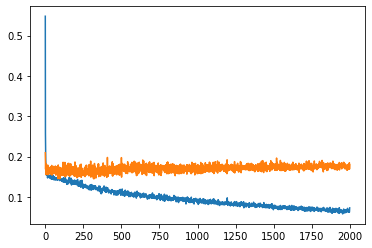

In [40]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [41]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = gru_norm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [42]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.09190307337495188


# Make predictions based on test set and get a root mean squared error 

In [43]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = gru_norm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [44]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.24021211911300122


# Plot train labels along with train predictions

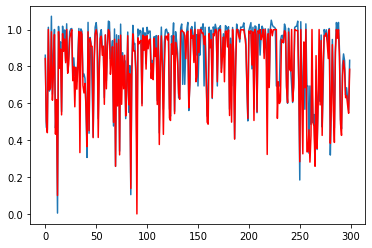

In [45]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

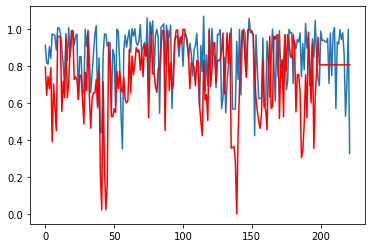

In [46]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [47]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [48]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [49]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [50]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [51]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [52]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [53]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [54]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [55]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [56]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [57]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [58]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [59]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [60]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Build gru model

In [61]:
gru_combined_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.GRU(50, dropout=0.2, recurrent_dropout=0.2, input_shape=(train_X.shape[1], train_X.shape[2])),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [62]:
from tensorflow import keras

gru_combined_model.compile(loss='mae', optimizer='adam')

# Train model

In [63]:
history = gru_combined_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 1s - loss: 9.7761 - val_loss: 15.0697
Epoch 2/2000
10/10 - 0s - loss: 8.2594 - val_loss: 14.1144
Epoch 3/2000
10/10 - 0s - loss: 7.0220 - val_loss: 12.9352
Epoch 4/2000
10/10 - 0s - loss: 5.9109 - val_loss: 11.7731
Epoch 5/2000
10/10 - 1s - loss: 5.5623 - val_loss: 10.9850
Epoch 6/2000
10/10 - 0s - loss: 5.4329 - val_loss: 10.8063
Epoch 7/2000
10/10 - 0s - loss: 5.3174 - val_loss: 10.6502
Epoch 8/2000
10/10 - 0s - loss: 5.3467 - val_loss: 10.6640
Epoch 9/2000
10/10 - 0s - loss: 5.2327 - val_loss: 10.6883
Epoch 10/2000
10/10 - 0s - loss: 5.2877 - val_loss: 10.7912
Epoch 11/2000
10/10 - 0s - loss: 5.1469 - val_loss: 10.8423
Epoch 12/2000
10/10 - 0s - loss: 5.2002 - val_loss: 10.7988
Epoch 13/2000
10/10 - 1s - loss: 5.1745 - val_loss: 10.8092
Epoch 14/2000
10/10 - 0s - loss: 5.1610 - val_loss: 10.8690
Epoch 15/2000
10/10 - 0s - loss: 5.1478 - val_loss: 10.9247
Epoch 16/2000
10/10 - 0s - loss: 5.1276 - val_loss: 10.9772
Epoch 17/2000
10/10 - 1s - loss: 5.1733 - val_los

Epoch 138/2000
10/10 - 0s - loss: 3.7235 - val_loss: 9.6590
Epoch 139/2000
10/10 - 0s - loss: 3.8827 - val_loss: 9.9030
Epoch 140/2000
10/10 - 0s - loss: 3.6373 - val_loss: 10.0458
Epoch 141/2000
10/10 - 0s - loss: 3.6006 - val_loss: 10.0135
Epoch 142/2000
10/10 - 1s - loss: 3.6926 - val_loss: 10.0001
Epoch 143/2000
10/10 - 0s - loss: 3.6835 - val_loss: 10.0554
Epoch 144/2000
10/10 - 1s - loss: 3.6568 - val_loss: 10.0632
Epoch 145/2000
10/10 - 1s - loss: 3.6225 - val_loss: 10.0093
Epoch 146/2000
10/10 - 0s - loss: 3.8141 - val_loss: 10.0372
Epoch 147/2000
10/10 - 0s - loss: 3.6992 - val_loss: 10.2262
Epoch 148/2000
10/10 - 0s - loss: 3.9817 - val_loss: 10.2515
Epoch 149/2000
10/10 - 0s - loss: 3.5499 - val_loss: 9.9705
Epoch 150/2000
10/10 - 0s - loss: 3.7105 - val_loss: 9.8422
Epoch 151/2000
10/10 - 0s - loss: 3.8365 - val_loss: 10.0177
Epoch 152/2000
10/10 - 1s - loss: 3.9054 - val_loss: 10.3105
Epoch 153/2000
10/10 - 1s - loss: 3.9050 - val_loss: 10.3338
Epoch 154/2000
10/10 - 1s - 

Epoch 273/2000
10/10 - 0s - loss: 3.3243 - val_loss: 10.5369
Epoch 274/2000
10/10 - 0s - loss: 3.5967 - val_loss: 10.3418
Epoch 275/2000
10/10 - 0s - loss: 3.4823 - val_loss: 10.6627
Epoch 276/2000
10/10 - 0s - loss: 3.4287 - val_loss: 10.5872
Epoch 277/2000
10/10 - 0s - loss: 3.0178 - val_loss: 10.8314
Epoch 278/2000
10/10 - 0s - loss: 3.3827 - val_loss: 10.6210
Epoch 279/2000
10/10 - 0s - loss: 3.5702 - val_loss: 10.6763
Epoch 280/2000
10/10 - 0s - loss: 3.6303 - val_loss: 10.6534
Epoch 281/2000
10/10 - 0s - loss: 3.4732 - val_loss: 10.4216
Epoch 282/2000
10/10 - 0s - loss: 3.4343 - val_loss: 10.4503
Epoch 283/2000
10/10 - 0s - loss: 3.4623 - val_loss: 10.6535
Epoch 284/2000
10/10 - 0s - loss: 3.3935 - val_loss: 10.1560
Epoch 285/2000
10/10 - 0s - loss: 3.3545 - val_loss: 10.4479
Epoch 286/2000
10/10 - 0s - loss: 3.5627 - val_loss: 10.3078
Epoch 287/2000
10/10 - 0s - loss: 3.2951 - val_loss: 10.2731
Epoch 288/2000
10/10 - 1s - loss: 3.5663 - val_loss: 10.2525
Epoch 289/2000
10/10 - 1

Epoch 408/2000
10/10 - 0s - loss: 3.8505 - val_loss: 14.3007
Epoch 409/2000
10/10 - 0s - loss: 3.9122 - val_loss: 14.2587
Epoch 410/2000
10/10 - 0s - loss: 4.0386 - val_loss: 14.0891
Epoch 411/2000
10/10 - 0s - loss: 3.6722 - val_loss: 13.5251
Epoch 412/2000
10/10 - 0s - loss: 3.8936 - val_loss: 13.5019
Epoch 413/2000
10/10 - 0s - loss: 4.0131 - val_loss: 14.1245
Epoch 414/2000
10/10 - 0s - loss: 3.9596 - val_loss: 14.2436
Epoch 415/2000
10/10 - 0s - loss: 3.9361 - val_loss: 13.9660
Epoch 416/2000
10/10 - 1s - loss: 3.9787 - val_loss: 13.6115
Epoch 417/2000
10/10 - 0s - loss: 3.7933 - val_loss: 13.7470
Epoch 418/2000
10/10 - 0s - loss: 3.8406 - val_loss: 13.8092
Epoch 419/2000
10/10 - 0s - loss: 3.6747 - val_loss: 13.3850
Epoch 420/2000
10/10 - 0s - loss: 3.9254 - val_loss: 13.7247
Epoch 421/2000
10/10 - 0s - loss: 3.7945 - val_loss: 13.8173
Epoch 422/2000
10/10 - 0s - loss: 3.7709 - val_loss: 13.6743
Epoch 423/2000
10/10 - 0s - loss: 3.8134 - val_loss: 13.2244
Epoch 424/2000
10/10 - 0

10/10 - 0s - loss: 3.1912 - val_loss: 9.8387
Epoch 544/2000
10/10 - 0s - loss: 3.0638 - val_loss: 9.7581
Epoch 545/2000
10/10 - 1s - loss: 2.9379 - val_loss: 9.8335
Epoch 546/2000
10/10 - 0s - loss: 2.9369 - val_loss: 10.0226
Epoch 547/2000
10/10 - 0s - loss: 3.2799 - val_loss: 9.9205
Epoch 548/2000
10/10 - 1s - loss: 3.0431 - val_loss: 9.9344
Epoch 549/2000
10/10 - 0s - loss: 2.9599 - val_loss: 9.7732
Epoch 550/2000
10/10 - 0s - loss: 2.7422 - val_loss: 9.9608
Epoch 551/2000
10/10 - 0s - loss: 2.8598 - val_loss: 9.8090
Epoch 552/2000
10/10 - 0s - loss: 3.2878 - val_loss: 9.9936
Epoch 553/2000
10/10 - 0s - loss: 2.7296 - val_loss: 9.6925
Epoch 554/2000
10/10 - 0s - loss: 2.8917 - val_loss: 9.8541
Epoch 555/2000
10/10 - 0s - loss: 2.8261 - val_loss: 9.7939
Epoch 556/2000
10/10 - 0s - loss: 2.9582 - val_loss: 9.9991
Epoch 557/2000
10/10 - 0s - loss: 2.8871 - val_loss: 9.6886
Epoch 558/2000
10/10 - 0s - loss: 2.5977 - val_loss: 9.9543
Epoch 559/2000
10/10 - 1s - loss: 2.9484 - val_loss: 9

10/10 - 1s - loss: 4.1333 - val_loss: 10.8902
Epoch 679/2000
10/10 - 0s - loss: 4.1862 - val_loss: 10.9347
Epoch 680/2000
10/10 - 0s - loss: 4.0941 - val_loss: 10.8614
Epoch 681/2000
10/10 - 1s - loss: 4.3372 - val_loss: 10.8393
Epoch 682/2000
10/10 - 1s - loss: 4.0937 - val_loss: 10.8541
Epoch 683/2000
10/10 - 1s - loss: 4.1565 - val_loss: 10.8707
Epoch 684/2000
10/10 - 0s - loss: 4.1874 - val_loss: 10.8251
Epoch 685/2000
10/10 - 1s - loss: 4.1825 - val_loss: 10.7592
Epoch 686/2000
10/10 - 1s - loss: 4.3761 - val_loss: 11.0087
Epoch 687/2000
10/10 - 1s - loss: 4.1033 - val_loss: 10.7417
Epoch 688/2000
10/10 - 1s - loss: 4.0003 - val_loss: 10.7818
Epoch 689/2000
10/10 - 1s - loss: 4.1201 - val_loss: 10.9207
Epoch 690/2000
10/10 - 0s - loss: 4.3557 - val_loss: 11.0925
Epoch 691/2000
10/10 - 0s - loss: 3.9812 - val_loss: 10.6898
Epoch 692/2000
10/10 - 0s - loss: 4.0395 - val_loss: 10.4578
Epoch 693/2000
10/10 - 0s - loss: 4.0602 - val_loss: 10.6222
Epoch 694/2000
10/10 - 0s - loss: 4.355

Epoch 813/2000
10/10 - 0s - loss: 3.7227 - val_loss: 10.6538
Epoch 814/2000
10/10 - 0s - loss: 3.6019 - val_loss: 10.5055
Epoch 815/2000
10/10 - 0s - loss: 3.9412 - val_loss: 10.8298
Epoch 816/2000
10/10 - 0s - loss: 3.8265 - val_loss: 11.0642
Epoch 817/2000
10/10 - 0s - loss: 3.7606 - val_loss: 10.9676
Epoch 818/2000
10/10 - 0s - loss: 3.5381 - val_loss: 10.5841
Epoch 819/2000
10/10 - 0s - loss: 3.5406 - val_loss: 10.7470
Epoch 820/2000
10/10 - 0s - loss: 3.6260 - val_loss: 10.8650
Epoch 821/2000
10/10 - 0s - loss: 3.6405 - val_loss: 11.1897
Epoch 822/2000
10/10 - 0s - loss: 3.6528 - val_loss: 10.7942
Epoch 823/2000
10/10 - 0s - loss: 3.7703 - val_loss: 10.4172
Epoch 824/2000
10/10 - 0s - loss: 3.7867 - val_loss: 10.5933
Epoch 825/2000
10/10 - 0s - loss: 3.7042 - val_loss: 10.9272
Epoch 826/2000
10/10 - 0s - loss: 3.9614 - val_loss: 11.9213
Epoch 827/2000
10/10 - 0s - loss: 3.7250 - val_loss: 10.9408
Epoch 828/2000
10/10 - 0s - loss: 3.8058 - val_loss: 10.7227
Epoch 829/2000
10/10 - 0

Epoch 948/2000
10/10 - 0s - loss: 3.2674 - val_loss: 9.7691
Epoch 949/2000
10/10 - 0s - loss: 3.7697 - val_loss: 9.8676
Epoch 950/2000
10/10 - 0s - loss: 3.8614 - val_loss: 10.1889
Epoch 951/2000
10/10 - 0s - loss: 3.5471 - val_loss: 10.2531
Epoch 952/2000
10/10 - 0s - loss: 3.7517 - val_loss: 10.5888
Epoch 953/2000
10/10 - 0s - loss: 3.4486 - val_loss: 10.5783
Epoch 954/2000
10/10 - 0s - loss: 3.2929 - val_loss: 10.9016
Epoch 955/2000
10/10 - 0s - loss: 3.5287 - val_loss: 10.7866
Epoch 956/2000
10/10 - 0s - loss: 3.4207 - val_loss: 11.1145
Epoch 957/2000
10/10 - 0s - loss: 3.4115 - val_loss: 11.1004
Epoch 958/2000
10/10 - 0s - loss: 3.0824 - val_loss: 11.2637
Epoch 959/2000
10/10 - 1s - loss: 3.3874 - val_loss: 11.1836
Epoch 960/2000
10/10 - 0s - loss: 3.3117 - val_loss: 11.6594
Epoch 961/2000
10/10 - 0s - loss: 3.2549 - val_loss: 12.2501
Epoch 962/2000
10/10 - 0s - loss: 3.1720 - val_loss: 12.1446
Epoch 963/2000
10/10 - 0s - loss: 3.2069 - val_loss: 11.9006
Epoch 964/2000
10/10 - 0s 

Epoch 1082/2000
10/10 - 0s - loss: 3.0246 - val_loss: 9.1486
Epoch 1083/2000
10/10 - 0s - loss: 3.1486 - val_loss: 9.2292
Epoch 1084/2000
10/10 - 0s - loss: 2.8438 - val_loss: 9.3177
Epoch 1085/2000
10/10 - 0s - loss: 3.1029 - val_loss: 9.2474
Epoch 1086/2000
10/10 - 0s - loss: 2.9382 - val_loss: 9.3816
Epoch 1087/2000
10/10 - 0s - loss: 2.7939 - val_loss: 9.2626
Epoch 1088/2000
10/10 - 0s - loss: 3.2058 - val_loss: 9.3849
Epoch 1089/2000
10/10 - 0s - loss: 3.1026 - val_loss: 9.3940
Epoch 1090/2000
10/10 - 0s - loss: 3.5060 - val_loss: 9.2547
Epoch 1091/2000
10/10 - 0s - loss: 3.1698 - val_loss: 9.3204
Epoch 1092/2000
10/10 - 0s - loss: 2.9464 - val_loss: 9.3669
Epoch 1093/2000
10/10 - 0s - loss: 2.7966 - val_loss: 9.1183
Epoch 1094/2000
10/10 - 0s - loss: 3.2425 - val_loss: 9.3872
Epoch 1095/2000
10/10 - 0s - loss: 2.7477 - val_loss: 9.2332
Epoch 1096/2000
10/10 - 0s - loss: 2.9647 - val_loss: 9.3460
Epoch 1097/2000
10/10 - 0s - loss: 2.9618 - val_loss: 9.1429
Epoch 1098/2000
10/10 - 

Epoch 1217/2000
10/10 - 0s - loss: 2.3572 - val_loss: 9.4542
Epoch 1218/2000
10/10 - 0s - loss: 2.9284 - val_loss: 9.1408
Epoch 1219/2000
10/10 - 0s - loss: 2.6658 - val_loss: 9.4518
Epoch 1220/2000
10/10 - 0s - loss: 3.0081 - val_loss: 9.5381
Epoch 1221/2000
10/10 - 0s - loss: 2.9939 - val_loss: 9.1964
Epoch 1222/2000
10/10 - 0s - loss: 3.1626 - val_loss: 9.0849
Epoch 1223/2000
10/10 - 0s - loss: 2.4873 - val_loss: 9.1382
Epoch 1224/2000
10/10 - 0s - loss: 2.5847 - val_loss: 9.2974
Epoch 1225/2000
10/10 - 0s - loss: 3.0677 - val_loss: 9.1293
Epoch 1226/2000
10/10 - 0s - loss: 3.2825 - val_loss: 9.2410
Epoch 1227/2000
10/10 - 0s - loss: 2.7954 - val_loss: 9.2148
Epoch 1228/2000
10/10 - 0s - loss: 2.6998 - val_loss: 9.1124
Epoch 1229/2000
10/10 - 0s - loss: 2.7787 - val_loss: 9.0551
Epoch 1230/2000
10/10 - 0s - loss: 2.9333 - val_loss: 9.2096
Epoch 1231/2000
10/10 - 0s - loss: 3.6192 - val_loss: 9.2280
Epoch 1232/2000
10/10 - 1s - loss: 2.7118 - val_loss: 9.0331
Epoch 1233/2000
10/10 - 

Epoch 1352/2000
10/10 - 0s - loss: 3.0894 - val_loss: 9.1825
Epoch 1353/2000
10/10 - 0s - loss: 2.9151 - val_loss: 9.1316
Epoch 1354/2000
10/10 - 0s - loss: 2.9777 - val_loss: 9.1508
Epoch 1355/2000
10/10 - 0s - loss: 2.7752 - val_loss: 8.9750
Epoch 1356/2000
10/10 - 0s - loss: 2.5557 - val_loss: 9.2158
Epoch 1357/2000
10/10 - 0s - loss: 2.8517 - val_loss: 9.1056
Epoch 1358/2000
10/10 - 0s - loss: 2.6255 - val_loss: 9.0068
Epoch 1359/2000
10/10 - 0s - loss: 2.9040 - val_loss: 9.0012
Epoch 1360/2000
10/10 - 0s - loss: 2.8030 - val_loss: 9.2796
Epoch 1361/2000
10/10 - 0s - loss: 2.8106 - val_loss: 9.0113
Epoch 1362/2000
10/10 - 0s - loss: 2.5906 - val_loss: 9.1506
Epoch 1363/2000
10/10 - 0s - loss: 2.4057 - val_loss: 9.2199
Epoch 1364/2000
10/10 - 0s - loss: 2.4252 - val_loss: 9.0230
Epoch 1365/2000
10/10 - 0s - loss: 2.6704 - val_loss: 9.2830
Epoch 1366/2000
10/10 - 0s - loss: 2.8438 - val_loss: 9.3610
Epoch 1367/2000
10/10 - 0s - loss: 2.9216 - val_loss: 9.2965
Epoch 1368/2000
10/10 - 

Epoch 1487/2000
10/10 - 0s - loss: 2.7846 - val_loss: 8.4739
Epoch 1488/2000
10/10 - 0s - loss: 3.2255 - val_loss: 8.5668
Epoch 1489/2000
10/10 - 0s - loss: 3.0553 - val_loss: 8.6478
Epoch 1490/2000
10/10 - 0s - loss: 2.7174 - val_loss: 8.8097
Epoch 1491/2000
10/10 - 0s - loss: 3.1299 - val_loss: 8.6989
Epoch 1492/2000
10/10 - 0s - loss: 3.0530 - val_loss: 8.8525
Epoch 1493/2000
10/10 - 0s - loss: 2.9692 - val_loss: 8.8814
Epoch 1494/2000
10/10 - 1s - loss: 2.5459 - val_loss: 8.8356
Epoch 1495/2000
10/10 - 0s - loss: 2.7905 - val_loss: 8.9038
Epoch 1496/2000
10/10 - 1s - loss: 2.9661 - val_loss: 9.0333
Epoch 1497/2000
10/10 - 0s - loss: 2.6316 - val_loss: 8.9491
Epoch 1498/2000
10/10 - 1s - loss: 2.5140 - val_loss: 9.0140
Epoch 1499/2000
10/10 - 0s - loss: 2.4267 - val_loss: 9.1417
Epoch 1500/2000
10/10 - 0s - loss: 2.9749 - val_loss: 9.2394
Epoch 1501/2000
10/10 - 0s - loss: 2.3025 - val_loss: 9.8256
Epoch 1502/2000
10/10 - 0s - loss: 2.2822 - val_loss: 9.6334
Epoch 1503/2000
10/10 - 

10/10 - 0s - loss: 2.6364 - val_loss: 8.2420
Epoch 1622/2000
10/10 - 0s - loss: 2.6417 - val_loss: 8.2330
Epoch 1623/2000
10/10 - 0s - loss: 2.8180 - val_loss: 8.3404
Epoch 1624/2000
10/10 - 0s - loss: 3.0277 - val_loss: 8.3506
Epoch 1625/2000
10/10 - 1s - loss: 2.7424 - val_loss: 8.3515
Epoch 1626/2000
10/10 - 0s - loss: 2.4447 - val_loss: 8.2975
Epoch 1627/2000
10/10 - 0s - loss: 2.5991 - val_loss: 8.2378
Epoch 1628/2000
10/10 - 0s - loss: 2.8767 - val_loss: 8.1499
Epoch 1629/2000
10/10 - 0s - loss: 2.8466 - val_loss: 8.0714
Epoch 1630/2000
10/10 - 0s - loss: 3.1354 - val_loss: 8.0410
Epoch 1631/2000
10/10 - 0s - loss: 2.9472 - val_loss: 7.9432
Epoch 1632/2000
10/10 - 0s - loss: 3.2117 - val_loss: 8.0026
Epoch 1633/2000
10/10 - 0s - loss: 3.0986 - val_loss: 7.9993
Epoch 1634/2000
10/10 - 0s - loss: 3.3467 - val_loss: 8.0758
Epoch 1635/2000
10/10 - 0s - loss: 2.4891 - val_loss: 8.1749
Epoch 1636/2000
10/10 - 0s - loss: 3.1451 - val_loss: 8.1931
Epoch 1637/2000
10/10 - 0s - loss: 2.862

Epoch 1755/2000
10/10 - 0s - loss: 4.6766 - val_loss: 10.2919
Epoch 1756/2000
10/10 - 1s - loss: 4.5708 - val_loss: 10.3562
Epoch 1757/2000
10/10 - 0s - loss: 4.6532 - val_loss: 10.4516
Epoch 1758/2000
10/10 - 0s - loss: 4.6289 - val_loss: 10.3060
Epoch 1759/2000
10/10 - 0s - loss: 4.5565 - val_loss: 10.1427
Epoch 1760/2000
10/10 - 0s - loss: 4.7176 - val_loss: 10.0538
Epoch 1761/2000
10/10 - 0s - loss: 4.6387 - val_loss: 10.1044
Epoch 1762/2000
10/10 - 0s - loss: 4.3924 - val_loss: 10.1903
Epoch 1763/2000
10/10 - 0s - loss: 4.5663 - val_loss: 10.2430
Epoch 1764/2000
10/10 - 0s - loss: 4.4419 - val_loss: 10.1133
Epoch 1765/2000
10/10 - 0s - loss: 4.6624 - val_loss: 9.9416
Epoch 1766/2000
10/10 - 0s - loss: 4.5845 - val_loss: 9.9912
Epoch 1767/2000
10/10 - 0s - loss: 4.7126 - val_loss: 10.0767
Epoch 1768/2000
10/10 - 0s - loss: 4.5161 - val_loss: 10.1508
Epoch 1769/2000
10/10 - 0s - loss: 4.3443 - val_loss: 10.0190
Epoch 1770/2000
10/10 - 0s - loss: 4.5722 - val_loss: 10.6401
Epoch 1771

Epoch 1889/2000
10/10 - 0s - loss: 4.3189 - val_loss: 9.8121
Epoch 1890/2000
10/10 - 0s - loss: 4.3925 - val_loss: 9.7992
Epoch 1891/2000
10/10 - 0s - loss: 4.4048 - val_loss: 9.7733
Epoch 1892/2000
10/10 - 0s - loss: 4.2226 - val_loss: 9.8997
Epoch 1893/2000
10/10 - 0s - loss: 4.3155 - val_loss: 9.9645
Epoch 1894/2000
10/10 - 0s - loss: 4.3220 - val_loss: 9.8821
Epoch 1895/2000
10/10 - 0s - loss: 4.3162 - val_loss: 9.8125
Epoch 1896/2000
10/10 - 0s - loss: 4.3960 - val_loss: 9.8106
Epoch 1897/2000
10/10 - 0s - loss: 4.3760 - val_loss: 9.6469
Epoch 1898/2000
10/10 - 0s - loss: 4.4071 - val_loss: 9.6706
Epoch 1899/2000
10/10 - 1s - loss: 4.4025 - val_loss: 9.7819
Epoch 1900/2000
10/10 - 1s - loss: 4.2745 - val_loss: 9.6901
Epoch 1901/2000
10/10 - 0s - loss: 4.5169 - val_loss: 9.6744
Epoch 1902/2000
10/10 - 0s - loss: 4.4100 - val_loss: 9.7210
Epoch 1903/2000
10/10 - 0s - loss: 4.3551 - val_loss: 9.7868
Epoch 1904/2000
10/10 - 0s - loss: 4.2200 - val_loss: 9.4794
Epoch 1905/2000
10/10 - 

# Plot model loss and validation loss

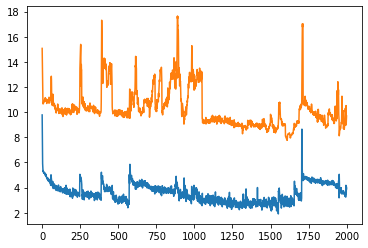

In [64]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [65]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = gru_combined_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [66]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 9.113964479925498


# Make predictions based on test set and get a root mean squared error 

In [67]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = gru_combined_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [68]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 14.084238133744464


# Plot train labels along with train predictions

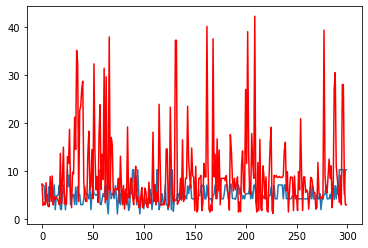

In [69]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

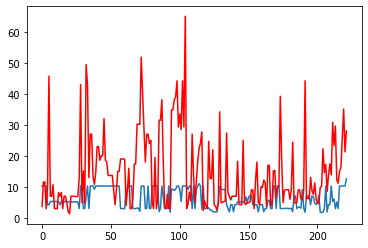

In [70]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [71]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [72]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [73]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [74]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [75]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [76]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [77]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [78]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [79]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [80]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [81]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [82]:
from sklearn.model_selection import train_test_split

n_train_periods = 300
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [83]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [84]:
train_y = train_y.reshape(300,)
test_y = test_y.reshape(222,)

In [85]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (300, 21, 9)
Shape of train_y: (300,)
Shape of test_X: (222, 21, 9)
Shape of test_y: (222,)


# Build gru model

In [86]:
gru_weather_norm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.GRU(50, dropout=0.2, recurrent_dropout=0.2, input_shape=(train_X.shape[1], train_X.shape[2])),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [87]:
from tensorflow import keras

gru_weather_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [88]:
history = gru_weather_norm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
10/10 - 1s - loss: 0.1867 - val_loss: 0.1540
Epoch 2/2000
10/10 - 0s - loss: 0.1464 - val_loss: 0.1471
Epoch 3/2000
10/10 - 0s - loss: 0.1342 - val_loss: 0.1457
Epoch 4/2000
10/10 - 0s - loss: 0.1363 - val_loss: 0.1431
Epoch 5/2000
10/10 - 0s - loss: 0.1328 - val_loss: 0.1407
Epoch 6/2000
10/10 - 0s - loss: 0.1280 - val_loss: 0.1409
Epoch 7/2000
10/10 - 0s - loss: 0.1322 - val_loss: 0.1432
Epoch 8/2000
10/10 - 1s - loss: 0.1313 - val_loss: 0.1448
Epoch 9/2000
10/10 - 0s - loss: 0.1265 - val_loss: 0.1382
Epoch 10/2000
10/10 - 0s - loss: 0.1237 - val_loss: 0.1424
Epoch 11/2000
10/10 - 0s - loss: 0.1293 - val_loss: 0.1443
Epoch 12/2000
10/10 - 0s - loss: 0.1320 - val_loss: 0.1456
Epoch 13/2000
10/10 - 0s - loss: 0.1260 - val_loss: 0.1376
Epoch 14/2000
10/10 - 0s - loss: 0.1277 - val_loss: 0.1417
Epoch 15/2000
10/10 - 0s - loss: 0.1290 - val_loss: 0.1395
Epoch 16/2000
10/10 - 0s - loss: 0.1268 - val_loss: 0.1407
Epoch 17/2000
10/10 - 0s - loss: 0.1236 - val_loss: 0.1452
Epoch 

Epoch 140/2000
10/10 - 0s - loss: 0.1178 - val_loss: 0.1386
Epoch 141/2000
10/10 - 0s - loss: 0.1184 - val_loss: 0.1363
Epoch 142/2000
10/10 - 0s - loss: 0.1173 - val_loss: 0.1347
Epoch 143/2000
10/10 - 0s - loss: 0.1158 - val_loss: 0.1361
Epoch 144/2000
10/10 - 0s - loss: 0.1181 - val_loss: 0.1402
Epoch 145/2000
10/10 - 0s - loss: 0.1217 - val_loss: 0.1387
Epoch 146/2000
10/10 - 0s - loss: 0.1170 - val_loss: 0.1400
Epoch 147/2000
10/10 - 0s - loss: 0.1198 - val_loss: 0.1407
Epoch 148/2000
10/10 - 0s - loss: 0.1171 - val_loss: 0.1350
Epoch 149/2000
10/10 - 0s - loss: 0.1161 - val_loss: 0.1381
Epoch 150/2000
10/10 - 0s - loss: 0.1164 - val_loss: 0.1369
Epoch 151/2000
10/10 - 0s - loss: 0.1159 - val_loss: 0.1326
Epoch 152/2000
10/10 - 0s - loss: 0.1159 - val_loss: 0.1355
Epoch 153/2000
10/10 - 0s - loss: 0.1147 - val_loss: 0.1352
Epoch 154/2000
10/10 - 0s - loss: 0.1166 - val_loss: 0.1369
Epoch 155/2000
10/10 - 0s - loss: 0.1169 - val_loss: 0.1383
Epoch 156/2000
10/10 - 0s - loss: 0.1152

Epoch 277/2000
10/10 - 0s - loss: 0.1090 - val_loss: 0.1404
Epoch 278/2000
10/10 - 0s - loss: 0.1021 - val_loss: 0.1369
Epoch 279/2000
10/10 - 0s - loss: 0.0959 - val_loss: 0.1447
Epoch 280/2000
10/10 - 0s - loss: 0.1012 - val_loss: 0.1422
Epoch 281/2000
10/10 - 0s - loss: 0.0982 - val_loss: 0.1434
Epoch 282/2000
10/10 - 0s - loss: 0.0978 - val_loss: 0.1352
Epoch 283/2000
10/10 - 0s - loss: 0.0971 - val_loss: 0.1435
Epoch 284/2000
10/10 - 0s - loss: 0.1018 - val_loss: 0.1383
Epoch 285/2000
10/10 - 0s - loss: 0.0958 - val_loss: 0.1337
Epoch 286/2000
10/10 - 0s - loss: 0.1009 - val_loss: 0.1436
Epoch 287/2000
10/10 - 0s - loss: 0.0945 - val_loss: 0.1461
Epoch 288/2000
10/10 - 0s - loss: 0.0966 - val_loss: 0.1383
Epoch 289/2000
10/10 - 0s - loss: 0.0980 - val_loss: 0.1413
Epoch 290/2000
10/10 - 0s - loss: 0.0935 - val_loss: 0.1421
Epoch 291/2000
10/10 - 0s - loss: 0.0930 - val_loss: 0.1397
Epoch 292/2000
10/10 - 0s - loss: 0.0978 - val_loss: 0.1434
Epoch 293/2000
10/10 - 0s - loss: 0.0934

Epoch 414/2000
10/10 - 0s - loss: 0.0865 - val_loss: 0.1412
Epoch 415/2000
10/10 - 0s - loss: 0.0842 - val_loss: 0.1456
Epoch 416/2000
10/10 - 0s - loss: 0.0880 - val_loss: 0.1508
Epoch 417/2000
10/10 - 0s - loss: 0.0890 - val_loss: 0.1443
Epoch 418/2000
10/10 - 0s - loss: 0.0889 - val_loss: 0.1448
Epoch 419/2000
10/10 - 0s - loss: 0.0894 - val_loss: 0.1409
Epoch 420/2000
10/10 - 0s - loss: 0.0912 - val_loss: 0.1490
Epoch 421/2000
10/10 - 0s - loss: 0.0861 - val_loss: 0.1378
Epoch 422/2000
10/10 - 0s - loss: 0.0862 - val_loss: 0.1383
Epoch 423/2000
10/10 - 0s - loss: 0.0835 - val_loss: 0.1438
Epoch 424/2000
10/10 - 0s - loss: 0.0861 - val_loss: 0.1365
Epoch 425/2000
10/10 - 0s - loss: 0.0866 - val_loss: 0.1395
Epoch 426/2000
10/10 - 0s - loss: 0.0899 - val_loss: 0.1500
Epoch 427/2000
10/10 - 0s - loss: 0.0912 - val_loss: 0.1404
Epoch 428/2000
10/10 - 0s - loss: 0.0887 - val_loss: 0.1456
Epoch 429/2000
10/10 - 0s - loss: 0.0919 - val_loss: 0.1439
Epoch 430/2000
10/10 - 0s - loss: 0.0840

Epoch 551/2000
10/10 - 0s - loss: 0.0855 - val_loss: 0.1398
Epoch 552/2000
10/10 - 0s - loss: 0.0786 - val_loss: 0.1535
Epoch 553/2000
10/10 - 0s - loss: 0.0816 - val_loss: 0.1500
Epoch 554/2000
10/10 - 0s - loss: 0.0812 - val_loss: 0.1513
Epoch 555/2000
10/10 - 0s - loss: 0.0834 - val_loss: 0.1451
Epoch 556/2000
10/10 - 0s - loss: 0.0816 - val_loss: 0.1440
Epoch 557/2000
10/10 - 0s - loss: 0.0836 - val_loss: 0.1500
Epoch 558/2000
10/10 - 0s - loss: 0.0825 - val_loss: 0.1489
Epoch 559/2000
10/10 - 0s - loss: 0.0813 - val_loss: 0.1439
Epoch 560/2000
10/10 - 0s - loss: 0.0807 - val_loss: 0.1545
Epoch 561/2000
10/10 - 0s - loss: 0.0796 - val_loss: 0.1450
Epoch 562/2000
10/10 - 0s - loss: 0.0830 - val_loss: 0.1475
Epoch 563/2000
10/10 - 0s - loss: 0.0798 - val_loss: 0.1558
Epoch 564/2000
10/10 - 0s - loss: 0.0821 - val_loss: 0.1443
Epoch 565/2000
10/10 - 1s - loss: 0.0813 - val_loss: 0.1460
Epoch 566/2000
10/10 - 0s - loss: 0.0838 - val_loss: 0.1533
Epoch 567/2000
10/10 - 0s - loss: 0.0796

Epoch 688/2000
10/10 - 0s - loss: 0.0743 - val_loss: 0.1542
Epoch 689/2000
10/10 - 0s - loss: 0.0747 - val_loss: 0.1496
Epoch 690/2000
10/10 - 0s - loss: 0.0754 - val_loss: 0.1558
Epoch 691/2000
10/10 - 0s - loss: 0.0769 - val_loss: 0.1481
Epoch 692/2000
10/10 - 0s - loss: 0.0792 - val_loss: 0.1482
Epoch 693/2000
10/10 - 1s - loss: 0.0786 - val_loss: 0.1479
Epoch 694/2000
10/10 - 0s - loss: 0.0741 - val_loss: 0.1462
Epoch 695/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1520
Epoch 696/2000
10/10 - 0s - loss: 0.0756 - val_loss: 0.1562
Epoch 697/2000
10/10 - 0s - loss: 0.0698 - val_loss: 0.1522
Epoch 698/2000
10/10 - 0s - loss: 0.0765 - val_loss: 0.1516
Epoch 699/2000
10/10 - 0s - loss: 0.0717 - val_loss: 0.1508
Epoch 700/2000
10/10 - 0s - loss: 0.0737 - val_loss: 0.1514
Epoch 701/2000
10/10 - 0s - loss: 0.0774 - val_loss: 0.1501
Epoch 702/2000
10/10 - 0s - loss: 0.0751 - val_loss: 0.1587
Epoch 703/2000
10/10 - 0s - loss: 0.0782 - val_loss: 0.1511
Epoch 704/2000
10/10 - 0s - loss: 0.0749

Epoch 825/2000
10/10 - 0s - loss: 0.0687 - val_loss: 0.1590
Epoch 826/2000
10/10 - 0s - loss: 0.0707 - val_loss: 0.1513
Epoch 827/2000
10/10 - 0s - loss: 0.0693 - val_loss: 0.1586
Epoch 828/2000
10/10 - 0s - loss: 0.0708 - val_loss: 0.1567
Epoch 829/2000
10/10 - 0s - loss: 0.0711 - val_loss: 0.1590
Epoch 830/2000
10/10 - 0s - loss: 0.0720 - val_loss: 0.1441
Epoch 831/2000
10/10 - 0s - loss: 0.0708 - val_loss: 0.1525
Epoch 832/2000
10/10 - 0s - loss: 0.0653 - val_loss: 0.1568
Epoch 833/2000
10/10 - 0s - loss: 0.0709 - val_loss: 0.1557
Epoch 834/2000
10/10 - 0s - loss: 0.0745 - val_loss: 0.1454
Epoch 835/2000
10/10 - 0s - loss: 0.0711 - val_loss: 0.1541
Epoch 836/2000
10/10 - 0s - loss: 0.0702 - val_loss: 0.1495
Epoch 837/2000
10/10 - 0s - loss: 0.0703 - val_loss: 0.1540
Epoch 838/2000
10/10 - 0s - loss: 0.0677 - val_loss: 0.1513
Epoch 839/2000
10/10 - 0s - loss: 0.0657 - val_loss: 0.1564
Epoch 840/2000
10/10 - 0s - loss: 0.0730 - val_loss: 0.1522
Epoch 841/2000
10/10 - 0s - loss: 0.0679

Epoch 962/2000
10/10 - 0s - loss: 0.0647 - val_loss: 0.1546
Epoch 963/2000
10/10 - 0s - loss: 0.0667 - val_loss: 0.1630
Epoch 964/2000
10/10 - 0s - loss: 0.0634 - val_loss: 0.1699
Epoch 965/2000
10/10 - 0s - loss: 0.0620 - val_loss: 0.1650
Epoch 966/2000
10/10 - 0s - loss: 0.0680 - val_loss: 0.1810
Epoch 967/2000
10/10 - 0s - loss: 0.0627 - val_loss: 0.1659
Epoch 968/2000
10/10 - 0s - loss: 0.0681 - val_loss: 0.1618
Epoch 969/2000
10/10 - 0s - loss: 0.0629 - val_loss: 0.1563
Epoch 970/2000
10/10 - 0s - loss: 0.0627 - val_loss: 0.1621
Epoch 971/2000
10/10 - 0s - loss: 0.0630 - val_loss: 0.1619
Epoch 972/2000
10/10 - 0s - loss: 0.0662 - val_loss: 0.1732
Epoch 973/2000
10/10 - 0s - loss: 0.0606 - val_loss: 0.1731
Epoch 974/2000
10/10 - 0s - loss: 0.0665 - val_loss: 0.1644
Epoch 975/2000
10/10 - 0s - loss: 0.0638 - val_loss: 0.1633
Epoch 976/2000
10/10 - 0s - loss: 0.0627 - val_loss: 0.1657
Epoch 977/2000
10/10 - 0s - loss: 0.0657 - val_loss: 0.1610
Epoch 978/2000
10/10 - 0s - loss: 0.0660

Epoch 1097/2000
10/10 - 0s - loss: 0.0614 - val_loss: 0.1660
Epoch 1098/2000
10/10 - 0s - loss: 0.0585 - val_loss: 0.1655
Epoch 1099/2000
10/10 - 0s - loss: 0.0602 - val_loss: 0.1682
Epoch 1100/2000
10/10 - 0s - loss: 0.0598 - val_loss: 0.1668
Epoch 1101/2000
10/10 - 0s - loss: 0.0598 - val_loss: 0.1720
Epoch 1102/2000
10/10 - 0s - loss: 0.0621 - val_loss: 0.1666
Epoch 1103/2000
10/10 - 0s - loss: 0.0613 - val_loss: 0.1641
Epoch 1104/2000
10/10 - 0s - loss: 0.0596 - val_loss: 0.1650
Epoch 1105/2000
10/10 - 0s - loss: 0.0634 - val_loss: 0.1675
Epoch 1106/2000
10/10 - 0s - loss: 0.0610 - val_loss: 0.1606
Epoch 1107/2000
10/10 - 0s - loss: 0.0585 - val_loss: 0.1633
Epoch 1108/2000
10/10 - 0s - loss: 0.0624 - val_loss: 0.1596
Epoch 1109/2000
10/10 - 0s - loss: 0.0655 - val_loss: 0.1604
Epoch 1110/2000
10/10 - 0s - loss: 0.0603 - val_loss: 0.1683
Epoch 1111/2000
10/10 - 0s - loss: 0.0623 - val_loss: 0.1616
Epoch 1112/2000
10/10 - 0s - loss: 0.0611 - val_loss: 0.1632
Epoch 1113/2000
10/10 - 

Epoch 1232/2000
10/10 - 0s - loss: 0.0595 - val_loss: 0.1589
Epoch 1233/2000
10/10 - 0s - loss: 0.0591 - val_loss: 0.1638
Epoch 1234/2000
10/10 - 0s - loss: 0.0528 - val_loss: 0.1579
Epoch 1235/2000
10/10 - 0s - loss: 0.0561 - val_loss: 0.1596
Epoch 1236/2000
10/10 - 0s - loss: 0.0613 - val_loss: 0.1588
Epoch 1237/2000
10/10 - 0s - loss: 0.0632 - val_loss: 0.1536
Epoch 1238/2000
10/10 - 0s - loss: 0.0609 - val_loss: 0.1623
Epoch 1239/2000
10/10 - 0s - loss: 0.0560 - val_loss: 0.1583
Epoch 1240/2000
10/10 - 0s - loss: 0.0602 - val_loss: 0.1609
Epoch 1241/2000
10/10 - 0s - loss: 0.0566 - val_loss: 0.1633
Epoch 1242/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1641
Epoch 1243/2000
10/10 - 0s - loss: 0.0590 - val_loss: 0.1575
Epoch 1244/2000
10/10 - 0s - loss: 0.0606 - val_loss: 0.1666
Epoch 1245/2000
10/10 - 0s - loss: 0.0621 - val_loss: 0.1601
Epoch 1246/2000
10/10 - 0s - loss: 0.0608 - val_loss: 0.1631
Epoch 1247/2000
10/10 - 0s - loss: 0.0604 - val_loss: 0.1614
Epoch 1248/2000
10/10 - 

Epoch 1367/2000
10/10 - 0s - loss: 0.0525 - val_loss: 0.1664
Epoch 1368/2000
10/10 - 0s - loss: 0.0577 - val_loss: 0.1607
Epoch 1369/2000
10/10 - 1s - loss: 0.0556 - val_loss: 0.1590
Epoch 1370/2000
10/10 - 0s - loss: 0.0580 - val_loss: 0.1557
Epoch 1371/2000
10/10 - 0s - loss: 0.0608 - val_loss: 0.1599
Epoch 1372/2000
10/10 - 0s - loss: 0.0594 - val_loss: 0.1646
Epoch 1373/2000
10/10 - 0s - loss: 0.0530 - val_loss: 0.1634
Epoch 1374/2000
10/10 - 0s - loss: 0.0560 - val_loss: 0.1671
Epoch 1375/2000
10/10 - 0s - loss: 0.0572 - val_loss: 0.1642
Epoch 1376/2000
10/10 - 0s - loss: 0.0536 - val_loss: 0.1605
Epoch 1377/2000
10/10 - 0s - loss: 0.0572 - val_loss: 0.1634
Epoch 1378/2000
10/10 - 0s - loss: 0.0562 - val_loss: 0.1641
Epoch 1379/2000
10/10 - 0s - loss: 0.0567 - val_loss: 0.1690
Epoch 1380/2000
10/10 - 0s - loss: 0.0543 - val_loss: 0.1592
Epoch 1381/2000
10/10 - 0s - loss: 0.0582 - val_loss: 0.1590
Epoch 1382/2000
10/10 - 0s - loss: 0.0596 - val_loss: 0.1629
Epoch 1383/2000
10/10 - 

Epoch 1502/2000
10/10 - 0s - loss: 0.0535 - val_loss: 0.1588
Epoch 1503/2000
10/10 - 0s - loss: 0.0537 - val_loss: 0.1641
Epoch 1504/2000
10/10 - 0s - loss: 0.0554 - val_loss: 0.1695
Epoch 1505/2000
10/10 - 0s - loss: 0.0590 - val_loss: 0.1656
Epoch 1506/2000
10/10 - 0s - loss: 0.0587 - val_loss: 0.1651
Epoch 1507/2000
10/10 - 0s - loss: 0.0575 - val_loss: 0.1613
Epoch 1508/2000
10/10 - 0s - loss: 0.0560 - val_loss: 0.1598
Epoch 1509/2000
10/10 - 0s - loss: 0.0552 - val_loss: 0.1600
Epoch 1510/2000
10/10 - 0s - loss: 0.0535 - val_loss: 0.1637
Epoch 1511/2000
10/10 - 0s - loss: 0.0567 - val_loss: 0.1644
Epoch 1512/2000
10/10 - 0s - loss: 0.0559 - val_loss: 0.1651
Epoch 1513/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1605
Epoch 1514/2000
10/10 - 0s - loss: 0.0557 - val_loss: 0.1605
Epoch 1515/2000
10/10 - 0s - loss: 0.0542 - val_loss: 0.1672
Epoch 1516/2000
10/10 - 0s - loss: 0.0543 - val_loss: 0.1649
Epoch 1517/2000
10/10 - 0s - loss: 0.0557 - val_loss: 0.1634
Epoch 1518/2000
10/10 - 

Epoch 1637/2000
10/10 - 0s - loss: 0.0551 - val_loss: 0.1638
Epoch 1638/2000
10/10 - 0s - loss: 0.0543 - val_loss: 0.1641
Epoch 1639/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1682
Epoch 1640/2000
10/10 - 0s - loss: 0.0519 - val_loss: 0.1634
Epoch 1641/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1718
Epoch 1642/2000
10/10 - 1s - loss: 0.0502 - val_loss: 0.1648
Epoch 1643/2000
10/10 - 0s - loss: 0.0521 - val_loss: 0.1661
Epoch 1644/2000
10/10 - 0s - loss: 0.0523 - val_loss: 0.1647
Epoch 1645/2000
10/10 - 0s - loss: 0.0494 - val_loss: 0.1652
Epoch 1646/2000
10/10 - 0s - loss: 0.0512 - val_loss: 0.1681
Epoch 1647/2000
10/10 - 0s - loss: 0.0532 - val_loss: 0.1668
Epoch 1648/2000
10/10 - 0s - loss: 0.0520 - val_loss: 0.1673
Epoch 1649/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1663
Epoch 1650/2000
10/10 - 0s - loss: 0.0517 - val_loss: 0.1609
Epoch 1651/2000
10/10 - 0s - loss: 0.0515 - val_loss: 0.1655
Epoch 1652/2000
10/10 - 0s - loss: 0.0514 - val_loss: 0.1667
Epoch 1653/2000
10/10 - 

Epoch 1772/2000
10/10 - 0s - loss: 0.0514 - val_loss: 0.1692
Epoch 1773/2000
10/10 - 0s - loss: 0.0472 - val_loss: 0.1596
Epoch 1774/2000
10/10 - 0s - loss: 0.0506 - val_loss: 0.1607
Epoch 1775/2000
10/10 - 0s - loss: 0.0493 - val_loss: 0.1526
Epoch 1776/2000
10/10 - 0s - loss: 0.0522 - val_loss: 0.1558
Epoch 1777/2000
10/10 - 0s - loss: 0.0474 - val_loss: 0.1630
Epoch 1778/2000
10/10 - 0s - loss: 0.0527 - val_loss: 0.1642
Epoch 1779/2000
10/10 - 0s - loss: 0.0471 - val_loss: 0.1561
Epoch 1780/2000
10/10 - 0s - loss: 0.0483 - val_loss: 0.1541
Epoch 1781/2000
10/10 - 0s - loss: 0.0502 - val_loss: 0.1627
Epoch 1782/2000
10/10 - 0s - loss: 0.0487 - val_loss: 0.1582
Epoch 1783/2000
10/10 - 0s - loss: 0.0476 - val_loss: 0.1610
Epoch 1784/2000
10/10 - 0s - loss: 0.0543 - val_loss: 0.1572
Epoch 1785/2000
10/10 - 0s - loss: 0.0479 - val_loss: 0.1588
Epoch 1786/2000
10/10 - 0s - loss: 0.0488 - val_loss: 0.1627
Epoch 1787/2000
10/10 - 0s - loss: 0.0464 - val_loss: 0.1628
Epoch 1788/2000
10/10 - 

Epoch 1907/2000
10/10 - 0s - loss: 0.0495 - val_loss: 0.1614
Epoch 1908/2000
10/10 - 0s - loss: 0.0491 - val_loss: 0.1596
Epoch 1909/2000
10/10 - 0s - loss: 0.0479 - val_loss: 0.1655
Epoch 1910/2000
10/10 - 0s - loss: 0.0493 - val_loss: 0.1703
Epoch 1911/2000
10/10 - 0s - loss: 0.0463 - val_loss: 0.1709
Epoch 1912/2000
10/10 - 0s - loss: 0.0464 - val_loss: 0.1703
Epoch 1913/2000
10/10 - 0s - loss: 0.0471 - val_loss: 0.1683
Epoch 1914/2000
10/10 - 0s - loss: 0.0470 - val_loss: 0.1635
Epoch 1915/2000
10/10 - 0s - loss: 0.0470 - val_loss: 0.1662
Epoch 1916/2000
10/10 - 0s - loss: 0.0460 - val_loss: 0.1674
Epoch 1917/2000
10/10 - 0s - loss: 0.0486 - val_loss: 0.1701
Epoch 1918/2000
10/10 - 0s - loss: 0.0488 - val_loss: 0.1687
Epoch 1919/2000
10/10 - 0s - loss: 0.0455 - val_loss: 0.1657
Epoch 1920/2000
10/10 - 0s - loss: 0.0475 - val_loss: 0.1617
Epoch 1921/2000
10/10 - 0s - loss: 0.0437 - val_loss: 0.1698
Epoch 1922/2000
10/10 - 0s - loss: 0.0432 - val_loss: 0.1681
Epoch 1923/2000
10/10 - 

# Plot model loss and validation loss

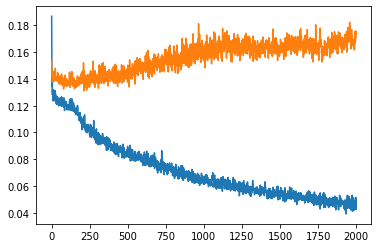

In [89]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [90]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = gru_weather_norm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [91]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.06270830299596215


# Make predictions based on test set and get a root mean squared error 

In [92]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = gru_weather_norm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [93]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.24272992090947831


# Plot train labels along with train predictions

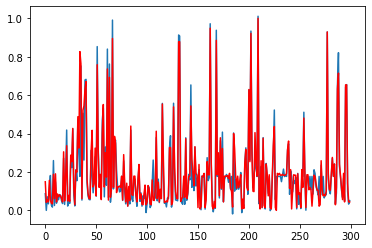

In [94]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

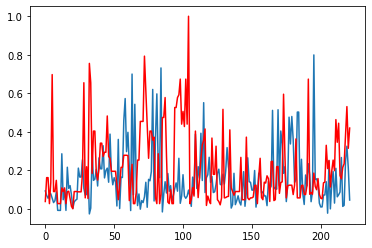

In [95]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of historical aadt data

In [20]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_with_Historical_AADT.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [21]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 162):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [22]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [23]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [24]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [25]:
for i in range(22):
    print(len(list_of_row_components[i]))

15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15


# Get length of list of lists

In [26]:
len(list_of_row_components)

3542

# Convert format of list to have a single time series for each index

In [27]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [28]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [29]:
list_of_examples.shape

(160, 22, 15)

# Perform train test split for dataset

In [30]:
from sklearn.model_selection import train_test_split

n_train_periods = 96
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [31]:
train_y = train_y.reshape(96,)
test_y = test_y.reshape(64,)

In [32]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (96, 21, 14)
Shape of train_y: (96,)
Shape of test_X: (64, 21, 14)
Shape of test_y: (64,)


# Build GRU model

In [33]:
gru_aadt_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.GRU(50, dropout=0.2, recurrent_dropout=0.2, input_shape=(train_X.shape[1], train_X.shape[2])),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [34]:
from tensorflow import keras

gru_aadt_model.compile(loss='mae', optimizer='adam')

# Train model

In [35]:
history = gru_aadt_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
3/3 - 0s - loss: 12.1719 - val_loss: 14.4844
Epoch 2/2000
3/3 - 0s - loss: 11.5652 - val_loss: 13.7982
Epoch 3/2000
3/3 - 0s - loss: 10.6802 - val_loss: 13.0631
Epoch 4/2000
3/3 - 0s - loss: 9.9685 - val_loss: 12.4513
Epoch 5/2000
3/3 - 0s - loss: 9.2276 - val_loss: 11.8441
Epoch 6/2000
3/3 - 0s - loss: 8.6788 - val_loss: 11.3387
Epoch 7/2000
3/3 - 0s - loss: 8.3352 - val_loss: 10.9254
Epoch 8/2000
3/3 - 0s - loss: 8.2130 - val_loss: 10.5629
Epoch 9/2000
3/3 - 0s - loss: 8.1322 - val_loss: 10.3319
Epoch 10/2000
3/3 - 0s - loss: 7.6579 - val_loss: 10.1657
Epoch 11/2000
3/3 - 0s - loss: 7.8736 - val_loss: 10.0761
Epoch 12/2000
3/3 - 0s - loss: 7.7520 - val_loss: 10.0354
Epoch 13/2000
3/3 - 0s - loss: 7.8211 - val_loss: 9.9817
Epoch 14/2000
3/3 - 0s - loss: 7.6633 - val_loss: 9.9085
Epoch 15/2000
3/3 - 0s - loss: 7.5316 - val_loss: 9.8970
Epoch 16/2000
3/3 - 0s - loss: 7.7719 - val_loss: 9.9357
Epoch 17/2000
3/3 - 0s - loss: 7.5365 - val_loss: 9.9064
Epoch 18/2000
3/3 - 0s - 

Epoch 144/2000
3/3 - 0s - loss: 7.2084 - val_loss: 9.5329
Epoch 145/2000
3/3 - 0s - loss: 7.2727 - val_loss: 9.5730
Epoch 146/2000
3/3 - 0s - loss: 7.0496 - val_loss: 9.5893
Epoch 147/2000
3/3 - 0s - loss: 7.1244 - val_loss: 9.5847
Epoch 148/2000
3/3 - 0s - loss: 7.1726 - val_loss: 9.5661
Epoch 149/2000
3/3 - 0s - loss: 7.2700 - val_loss: 9.5515
Epoch 150/2000
3/3 - 0s - loss: 7.2419 - val_loss: 9.5426
Epoch 151/2000
3/3 - 0s - loss: 7.1529 - val_loss: 9.5294
Epoch 152/2000
3/3 - 0s - loss: 7.0559 - val_loss: 9.5130
Epoch 153/2000
3/3 - 0s - loss: 6.9940 - val_loss: 9.4928
Epoch 154/2000
3/3 - 0s - loss: 7.0649 - val_loss: 9.4772
Epoch 155/2000
3/3 - 0s - loss: 6.9530 - val_loss: 9.4759
Epoch 156/2000
3/3 - 0s - loss: 7.3035 - val_loss: 9.4657
Epoch 157/2000
3/3 - 0s - loss: 7.1421 - val_loss: 9.4498
Epoch 158/2000
3/3 - 0s - loss: 7.0570 - val_loss: 9.4463
Epoch 159/2000
3/3 - 0s - loss: 7.1337 - val_loss: 9.4655
Epoch 160/2000
3/3 - 0s - loss: 7.0331 - val_loss: 9.4270
Epoch 161/2000

3/3 - 0s - loss: 7.2721 - val_loss: 9.4418
Epoch 286/2000
3/3 - 0s - loss: 7.0130 - val_loss: 9.4392
Epoch 287/2000
3/3 - 0s - loss: 7.1982 - val_loss: 9.4384
Epoch 288/2000
3/3 - 0s - loss: 7.1600 - val_loss: 9.4644
Epoch 289/2000
3/3 - 0s - loss: 7.1258 - val_loss: 9.5092
Epoch 290/2000
3/3 - 0s - loss: 7.1350 - val_loss: 9.5374
Epoch 291/2000
3/3 - 0s - loss: 7.4213 - val_loss: 9.5551
Epoch 292/2000
3/3 - 0s - loss: 7.0319 - val_loss: 9.5807
Epoch 293/2000
3/3 - 0s - loss: 7.2011 - val_loss: 9.5971
Epoch 294/2000
3/3 - 0s - loss: 7.3606 - val_loss: 9.6046
Epoch 295/2000
3/3 - 0s - loss: 6.9395 - val_loss: 9.6548
Epoch 296/2000
3/3 - 0s - loss: 7.0736 - val_loss: 9.6205
Epoch 297/2000
3/3 - 0s - loss: 7.0565 - val_loss: 9.6211
Epoch 298/2000
3/3 - 0s - loss: 7.3068 - val_loss: 9.5986
Epoch 299/2000
3/3 - 0s - loss: 6.9922 - val_loss: 9.6419
Epoch 300/2000
3/3 - 0s - loss: 7.5264 - val_loss: 9.7002
Epoch 301/2000
3/3 - 0s - loss: 7.1910 - val_loss: 9.7494
Epoch 302/2000
3/3 - 0s - los

Epoch 427/2000
3/3 - 0s - loss: 6.8197 - val_loss: 10.1224
Epoch 428/2000
3/3 - 0s - loss: 7.1495 - val_loss: 10.1030
Epoch 429/2000
3/3 - 0s - loss: 6.9650 - val_loss: 10.1080
Epoch 430/2000
3/3 - 0s - loss: 7.3791 - val_loss: 10.1664
Epoch 431/2000
3/3 - 0s - loss: 6.9715 - val_loss: 10.1925
Epoch 432/2000
3/3 - 0s - loss: 7.0619 - val_loss: 10.1701
Epoch 433/2000
3/3 - 0s - loss: 6.9932 - val_loss: 10.1667
Epoch 434/2000
3/3 - 0s - loss: 6.9855 - val_loss: 10.1357
Epoch 435/2000
3/3 - 0s - loss: 7.0032 - val_loss: 10.0604
Epoch 436/2000
3/3 - 0s - loss: 7.0405 - val_loss: 10.0722
Epoch 437/2000
3/3 - 0s - loss: 6.8742 - val_loss: 10.0650
Epoch 438/2000
3/3 - 0s - loss: 7.0422 - val_loss: 10.0578
Epoch 439/2000
3/3 - 0s - loss: 7.1559 - val_loss: 10.0472
Epoch 440/2000
3/3 - 0s - loss: 7.3487 - val_loss: 10.0536
Epoch 441/2000
3/3 - 0s - loss: 7.0658 - val_loss: 10.0570
Epoch 442/2000
3/3 - 0s - loss: 7.2046 - val_loss: 10.0461
Epoch 443/2000
3/3 - 0s - loss: 7.1740 - val_loss: 10.01

Epoch 568/2000
3/3 - 0s - loss: 6.6754 - val_loss: 9.6435
Epoch 569/2000
3/3 - 0s - loss: 7.2315 - val_loss: 9.6309
Epoch 570/2000
3/3 - 0s - loss: 6.6244 - val_loss: 9.6241
Epoch 571/2000
3/3 - 0s - loss: 7.0660 - val_loss: 9.6226
Epoch 572/2000
3/3 - 0s - loss: 6.9469 - val_loss: 9.6213
Epoch 573/2000
3/3 - 0s - loss: 6.7568 - val_loss: 9.6117
Epoch 574/2000
3/3 - 0s - loss: 7.0953 - val_loss: 9.6052
Epoch 575/2000
3/3 - 0s - loss: 7.0992 - val_loss: 9.6054
Epoch 576/2000
3/3 - 0s - loss: 7.0307 - val_loss: 9.6157
Epoch 577/2000
3/3 - 0s - loss: 6.7613 - val_loss: 9.6176
Epoch 578/2000
3/3 - 0s - loss: 6.4873 - val_loss: 9.6191
Epoch 579/2000
3/3 - 0s - loss: 7.0933 - val_loss: 9.6279
Epoch 580/2000
3/3 - 0s - loss: 6.9552 - val_loss: 9.6276
Epoch 581/2000
3/3 - 0s - loss: 7.0107 - val_loss: 9.6308
Epoch 582/2000
3/3 - 0s - loss: 6.9320 - val_loss: 9.6161
Epoch 583/2000
3/3 - 0s - loss: 6.9220 - val_loss: 9.6077
Epoch 584/2000
3/3 - 0s - loss: 6.9631 - val_loss: 9.6092
Epoch 585/2000

3/3 - 0s - loss: 6.4311 - val_loss: 9.2731
Epoch 710/2000
3/3 - 0s - loss: 6.7689 - val_loss: 9.2828
Epoch 711/2000
3/3 - 0s - loss: 6.6796 - val_loss: 9.2918
Epoch 712/2000
3/3 - 0s - loss: 6.9809 - val_loss: 9.3008
Epoch 713/2000
3/3 - 0s - loss: 7.2909 - val_loss: 9.3196
Epoch 714/2000
3/3 - 0s - loss: 6.6680 - val_loss: 9.3437
Epoch 715/2000
3/3 - 0s - loss: 6.8302 - val_loss: 9.3679
Epoch 716/2000
3/3 - 0s - loss: 6.9871 - val_loss: 9.3839
Epoch 717/2000
3/3 - 0s - loss: 6.7977 - val_loss: 9.3871
Epoch 718/2000
3/3 - 0s - loss: 6.2392 - val_loss: 9.3667
Epoch 719/2000
3/3 - 0s - loss: 6.3906 - val_loss: 9.3507
Epoch 720/2000
3/3 - 0s - loss: 6.8729 - val_loss: 9.3262
Epoch 721/2000
3/3 - 0s - loss: 6.6902 - val_loss: 9.3212
Epoch 722/2000
3/3 - 0s - loss: 6.6656 - val_loss: 9.3190
Epoch 723/2000
3/3 - 0s - loss: 6.7345 - val_loss: 9.3177
Epoch 724/2000
3/3 - 0s - loss: 6.6809 - val_loss: 9.3198
Epoch 725/2000
3/3 - 0s - loss: 6.6836 - val_loss: 9.3256
Epoch 726/2000
3/3 - 0s - los

Epoch 849/2000
3/3 - 0s - loss: 7.2402 - val_loss: 11.0008
Epoch 850/2000
3/3 - 0s - loss: 7.0399 - val_loss: 10.9952
Epoch 851/2000
3/3 - 0s - loss: 7.1952 - val_loss: 10.9560
Epoch 852/2000
3/3 - 0s - loss: 7.2198 - val_loss: 10.9008
Epoch 853/2000
3/3 - 0s - loss: 7.2515 - val_loss: 10.8492
Epoch 854/2000
3/3 - 0s - loss: 7.1846 - val_loss: 10.8147
Epoch 855/2000
3/3 - 0s - loss: 6.9962 - val_loss: 10.8611
Epoch 856/2000
3/3 - 0s - loss: 6.9944 - val_loss: 10.8939
Epoch 857/2000
3/3 - 0s - loss: 7.2593 - val_loss: 10.9257
Epoch 858/2000
3/3 - 0s - loss: 7.2363 - val_loss: 10.9094
Epoch 859/2000
3/3 - 0s - loss: 6.8637 - val_loss: 10.9767
Epoch 860/2000
3/3 - 0s - loss: 7.2906 - val_loss: 10.9741
Epoch 861/2000
3/3 - 0s - loss: 7.1808 - val_loss: 10.9667
Epoch 862/2000
3/3 - 0s - loss: 7.2700 - val_loss: 11.0001
Epoch 863/2000
3/3 - 0s - loss: 7.1500 - val_loss: 11.0083
Epoch 864/2000
3/3 - 0s - loss: 7.0133 - val_loss: 11.0440
Epoch 865/2000
3/3 - 0s - loss: 7.0758 - val_loss: 11.00

Epoch 988/2000
3/3 - 0s - loss: 7.2403 - val_loss: 11.1160
Epoch 989/2000
3/3 - 0s - loss: 7.1602 - val_loss: 10.9898
Epoch 990/2000
3/3 - 0s - loss: 7.4357 - val_loss: 11.3154
Epoch 991/2000
3/3 - 0s - loss: 7.2988 - val_loss: 11.3258
Epoch 992/2000
3/3 - 0s - loss: 7.5369 - val_loss: 11.2916
Epoch 993/2000
3/3 - 0s - loss: 7.4592 - val_loss: 11.5791
Epoch 994/2000
3/3 - 0s - loss: 8.0938 - val_loss: 11.8554
Epoch 995/2000
3/3 - 0s - loss: 7.3495 - val_loss: 11.8227
Epoch 996/2000
3/3 - 0s - loss: 7.4986 - val_loss: 11.4865
Epoch 997/2000
3/3 - 0s - loss: 7.1423 - val_loss: 11.1063
Epoch 998/2000
3/3 - 0s - loss: 7.3068 - val_loss: 10.8157
Epoch 999/2000
3/3 - 0s - loss: 7.4880 - val_loss: 10.5524
Epoch 1000/2000
3/3 - 0s - loss: 7.2975 - val_loss: 10.4273
Epoch 1001/2000
3/3 - 0s - loss: 7.3388 - val_loss: 10.2833
Epoch 1002/2000
3/3 - 0s - loss: 7.2787 - val_loss: 10.2628
Epoch 1003/2000
3/3 - 0s - loss: 7.3695 - val_loss: 10.2773
Epoch 1004/2000
3/3 - 0s - loss: 7.3930 - val_loss: 

3/3 - 0s - loss: 6.7752 - val_loss: 9.9733
Epoch 1127/2000
3/3 - 0s - loss: 6.7677 - val_loss: 9.9849
Epoch 1128/2000
3/3 - 0s - loss: 6.7969 - val_loss: 10.0175
Epoch 1129/2000
3/3 - 0s - loss: 7.4293 - val_loss: 10.0578
Epoch 1130/2000
3/3 - 0s - loss: 6.9727 - val_loss: 10.0942
Epoch 1131/2000
3/3 - 0s - loss: 6.8516 - val_loss: 10.1022
Epoch 1132/2000
3/3 - 0s - loss: 7.0434 - val_loss: 10.0835
Epoch 1133/2000
3/3 - 0s - loss: 7.1109 - val_loss: 10.0711
Epoch 1134/2000
3/3 - 0s - loss: 7.1478 - val_loss: 10.0553
Epoch 1135/2000
3/3 - 0s - loss: 7.0159 - val_loss: 10.0374
Epoch 1136/2000
3/3 - 0s - loss: 7.0007 - val_loss: 10.0330
Epoch 1137/2000
3/3 - 0s - loss: 6.8207 - val_loss: 10.0371
Epoch 1138/2000
3/3 - 0s - loss: 6.9621 - val_loss: 10.0326
Epoch 1139/2000
3/3 - 0s - loss: 6.9953 - val_loss: 10.0281
Epoch 1140/2000
3/3 - 0s - loss: 7.0623 - val_loss: 10.0364
Epoch 1141/2000
3/3 - 0s - loss: 7.4316 - val_loss: 10.0273
Epoch 1142/2000
3/3 - 0s - loss: 7.2290 - val_loss: 9.9979

Epoch 1263/2000
3/3 - 0s - loss: 7.0082 - val_loss: 10.0118
Epoch 1264/2000
3/3 - 0s - loss: 7.0341 - val_loss: 9.9266
Epoch 1265/2000
3/3 - 0s - loss: 6.9451 - val_loss: 9.8946
Epoch 1266/2000
3/3 - 0s - loss: 7.1803 - val_loss: 9.8929
Epoch 1267/2000
3/3 - 0s - loss: 6.8453 - val_loss: 9.9071
Epoch 1268/2000
3/3 - 0s - loss: 6.8858 - val_loss: 9.8963
Epoch 1269/2000
3/3 - 0s - loss: 7.4055 - val_loss: 9.9013
Epoch 1270/2000
3/3 - 0s - loss: 6.8789 - val_loss: 9.9481
Epoch 1271/2000
3/3 - 0s - loss: 6.8609 - val_loss: 9.9564
Epoch 1272/2000
3/3 - 0s - loss: 7.0423 - val_loss: 9.9416
Epoch 1273/2000
3/3 - 0s - loss: 7.0601 - val_loss: 9.9145
Epoch 1274/2000
3/3 - 0s - loss: 7.0416 - val_loss: 9.9216
Epoch 1275/2000
3/3 - 0s - loss: 6.9536 - val_loss: 9.9262
Epoch 1276/2000
3/3 - 0s - loss: 6.8614 - val_loss: 9.9216
Epoch 1277/2000
3/3 - 0s - loss: 6.9801 - val_loss: 9.8032
Epoch 1278/2000
3/3 - 0s - loss: 7.1644 - val_loss: 9.7582
Epoch 1279/2000
3/3 - 0s - loss: 7.0617 - val_loss: 9.7

Epoch 1402/2000
3/3 - 0s - loss: 7.4303 - val_loss: 9.7409
Epoch 1403/2000
3/3 - 0s - loss: 7.2808 - val_loss: 9.7503
Epoch 1404/2000
3/3 - 0s - loss: 7.2405 - val_loss: 9.7647
Epoch 1405/2000
3/3 - 0s - loss: 7.1172 - val_loss: 9.7640
Epoch 1406/2000
3/3 - 0s - loss: 6.9501 - val_loss: 9.7618
Epoch 1407/2000
3/3 - 0s - loss: 6.7885 - val_loss: 9.7439
Epoch 1408/2000
3/3 - 0s - loss: 7.0429 - val_loss: 9.7260
Epoch 1409/2000
3/3 - 0s - loss: 6.8927 - val_loss: 9.7327
Epoch 1410/2000
3/3 - 0s - loss: 7.2860 - val_loss: 9.7367
Epoch 1411/2000
3/3 - 0s - loss: 6.9963 - val_loss: 9.7413
Epoch 1412/2000
3/3 - 0s - loss: 7.2185 - val_loss: 9.7615
Epoch 1413/2000
3/3 - 0s - loss: 7.2188 - val_loss: 9.7843
Epoch 1414/2000
3/3 - 0s - loss: 7.0229 - val_loss: 9.8093
Epoch 1415/2000
3/3 - 0s - loss: 6.9416 - val_loss: 9.8281
Epoch 1416/2000
3/3 - 0s - loss: 7.1697 - val_loss: 9.7880
Epoch 1417/2000
3/3 - 0s - loss: 7.0753 - val_loss: 9.7611
Epoch 1418/2000
3/3 - 0s - loss: 7.0278 - val_loss: 9.72

Epoch 1541/2000
3/3 - 0s - loss: 7.0702 - val_loss: 9.8613
Epoch 1542/2000
3/3 - 0s - loss: 7.0821 - val_loss: 9.8728
Epoch 1543/2000
3/3 - 0s - loss: 6.8106 - val_loss: 9.8890
Epoch 1544/2000
3/3 - 0s - loss: 7.0849 - val_loss: 9.8948
Epoch 1545/2000
3/3 - 0s - loss: 6.9182 - val_loss: 9.9104
Epoch 1546/2000
3/3 - 0s - loss: 7.0316 - val_loss: 9.9115
Epoch 1547/2000
3/3 - 0s - loss: 6.8735 - val_loss: 9.8966
Epoch 1548/2000
3/3 - 0s - loss: 7.0433 - val_loss: 9.8700
Epoch 1549/2000
3/3 - 0s - loss: 7.1186 - val_loss: 9.8460
Epoch 1550/2000
3/3 - 0s - loss: 7.2009 - val_loss: 9.8386
Epoch 1551/2000
3/3 - 0s - loss: 7.0953 - val_loss: 9.8426
Epoch 1552/2000
3/3 - 0s - loss: 7.2519 - val_loss: 9.8528
Epoch 1553/2000
3/3 - 0s - loss: 6.9047 - val_loss: 9.8510
Epoch 1554/2000
3/3 - 0s - loss: 6.9337 - val_loss: 9.8436
Epoch 1555/2000
3/3 - 0s - loss: 6.9211 - val_loss: 9.8422
Epoch 1556/2000
3/3 - 0s - loss: 6.8656 - val_loss: 9.8417
Epoch 1557/2000
3/3 - 0s - loss: 7.5664 - val_loss: 9.85

Epoch 1680/2000
3/3 - 0s - loss: 7.1515 - val_loss: 10.0992
Epoch 1681/2000
3/3 - 0s - loss: 7.3788 - val_loss: 10.1215
Epoch 1682/2000
3/3 - 0s - loss: 6.9378 - val_loss: 10.1381
Epoch 1683/2000
3/3 - 0s - loss: 7.2360 - val_loss: 10.1495
Epoch 1684/2000
3/3 - 0s - loss: 6.8401 - val_loss: 10.1763
Epoch 1685/2000
3/3 - 0s - loss: 7.1368 - val_loss: 10.1992
Epoch 1686/2000
3/3 - 0s - loss: 6.8513 - val_loss: 10.1811
Epoch 1687/2000
3/3 - 0s - loss: 7.0881 - val_loss: 10.1522
Epoch 1688/2000
3/3 - 0s - loss: 6.8595 - val_loss: 10.1256
Epoch 1689/2000
3/3 - 0s - loss: 6.8214 - val_loss: 10.1078
Epoch 1690/2000
3/3 - 0s - loss: 6.9876 - val_loss: 10.1235
Epoch 1691/2000
3/3 - 0s - loss: 6.9123 - val_loss: 10.1209
Epoch 1692/2000
3/3 - 0s - loss: 6.8532 - val_loss: 10.1471
Epoch 1693/2000
3/3 - 0s - loss: 6.7968 - val_loss: 10.1719
Epoch 1694/2000
3/3 - 0s - loss: 6.5552 - val_loss: 10.1972
Epoch 1695/2000
3/3 - 0s - loss: 7.3261 - val_loss: 10.2196
Epoch 1696/2000
3/3 - 0s - loss: 7.0922 

Epoch 1818/2000
3/3 - 0s - loss: 7.1565 - val_loss: 9.6734
Epoch 1819/2000
3/3 - 0s - loss: 6.8125 - val_loss: 9.6484
Epoch 1820/2000
3/3 - 0s - loss: 7.1324 - val_loss: 9.6373
Epoch 1821/2000
3/3 - 0s - loss: 6.9614 - val_loss: 9.6325
Epoch 1822/2000
3/3 - 0s - loss: 6.9856 - val_loss: 9.6323
Epoch 1823/2000
3/3 - 0s - loss: 6.6794 - val_loss: 9.6324
Epoch 1824/2000
3/3 - 0s - loss: 6.9730 - val_loss: 9.6235
Epoch 1825/2000
3/3 - 0s - loss: 7.0574 - val_loss: 9.6132
Epoch 1826/2000
3/3 - 0s - loss: 6.8860 - val_loss: 9.5740
Epoch 1827/2000
3/3 - 0s - loss: 7.2199 - val_loss: 9.5662
Epoch 1828/2000
3/3 - 0s - loss: 7.2263 - val_loss: 9.5627
Epoch 1829/2000
3/3 - 0s - loss: 6.5930 - val_loss: 9.5335
Epoch 1830/2000
3/3 - 0s - loss: 6.6703 - val_loss: 9.5577
Epoch 1831/2000
3/3 - 0s - loss: 6.8698 - val_loss: 9.5913
Epoch 1832/2000
3/3 - 0s - loss: 6.4919 - val_loss: 9.6050
Epoch 1833/2000
3/3 - 0s - loss: 6.6267 - val_loss: 9.5956
Epoch 1834/2000
3/3 - 0s - loss: 6.7672 - val_loss: 9.59

Epoch 1957/2000
3/3 - 0s - loss: 6.1572 - val_loss: 10.3716
Epoch 1958/2000
3/3 - 0s - loss: 6.4429 - val_loss: 10.3415
Epoch 1959/2000
3/3 - 0s - loss: 7.4866 - val_loss: 10.3293
Epoch 1960/2000
3/3 - 0s - loss: 7.1033 - val_loss: 10.3550
Epoch 1961/2000
3/3 - 0s - loss: 7.1259 - val_loss: 10.3788
Epoch 1962/2000
3/3 - 0s - loss: 7.1310 - val_loss: 10.4010
Epoch 1963/2000
3/3 - 0s - loss: 7.3650 - val_loss: 10.2354
Epoch 1964/2000
3/3 - 0s - loss: 6.6915 - val_loss: 10.2637
Epoch 1965/2000
3/3 - 0s - loss: 7.0881 - val_loss: 10.2442
Epoch 1966/2000
3/3 - 0s - loss: 6.9971 - val_loss: 10.4173
Epoch 1967/2000
3/3 - 0s - loss: 6.9575 - val_loss: 10.4630
Epoch 1968/2000
3/3 - 0s - loss: 6.8878 - val_loss: 10.5544
Epoch 1969/2000
3/3 - 0s - loss: 7.5826 - val_loss: 10.5050
Epoch 1970/2000
3/3 - 0s - loss: 7.1872 - val_loss: 10.3097
Epoch 1971/2000
3/3 - 0s - loss: 7.2350 - val_loss: 10.2762
Epoch 1972/2000
3/3 - 0s - loss: 6.7154 - val_loss: 10.4112
Epoch 1973/2000
3/3 - 0s - loss: 7.1622 

# Plot model loss and validation loss

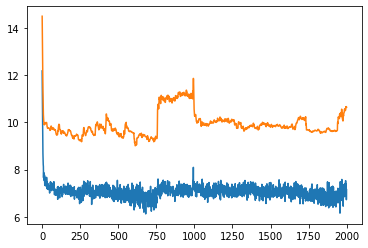

In [36]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [38]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = gru_aadt_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [39]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 11.730519516205971


# Make predictions based on test set and get a root mean squared error 

In [40]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = gru_aadt_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [41]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 15.349142499448027


# Plot train labels along with train predictions

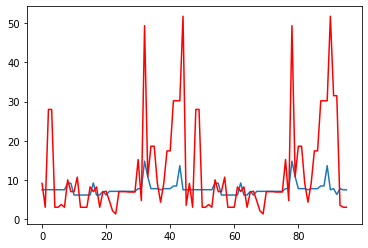

In [42]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

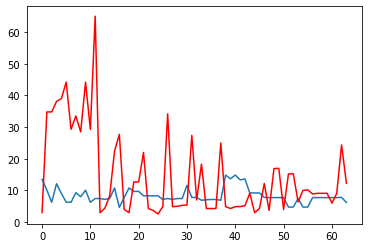

In [43]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of historical aadt data and normalization

In [44]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_with_Historical_AADT.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [45]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 162):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [46]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [47]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [48]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [49]:
for i in range(22):
    print(len(list_of_row_components[i]))

15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15


# Get length of list of lists

In [50]:
len(list_of_row_components)

3542

# Convert format of list to have a sinlge time series for each index

In [51]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [52]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [53]:
list_of_examples.shape

(160, 22, 15)

# Perform train test split for dataset

In [54]:
from sklearn.model_selection import train_test_split

n_train_periods = 96
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [55]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [56]:
train_y = train_y.reshape(96,)
test_y = test_y.reshape(64,)

In [57]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (96, 21, 14)
Shape of train_y: (96,)
Shape of test_X: (64, 21, 14)
Shape of test_y: (64,)


# Build GRU model

In [58]:
gru_aadt_norm_model = tf.keras.models.Sequential([
    # Shape [batch, time, features] => [batch, time, lstm_units]
    tf.keras.layers.GRU(50, dropout=0.2, recurrent_dropout=0.2, input_shape=(train_X.shape[1], train_X.shape[2])),
    tf.keras.layers.Dense(units=32),
    tf.keras.layers.Dense(units=1)
])

# Compile model

In [59]:
from tensorflow import keras

gru_aadt_norm_model.compile(loss='mae', optimizer='adam')

# Train model

In [60]:
history = gru_aadt_norm_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/2000
3/3 - 0s - loss: 0.2695 - val_loss: 0.2138
Epoch 2/2000
3/3 - 0s - loss: 0.2255 - val_loss: 0.2284
Epoch 3/2000
3/3 - 0s - loss: 0.2090 - val_loss: 0.2029
Epoch 4/2000
3/3 - 0s - loss: 0.1611 - val_loss: 0.2323
Epoch 5/2000
3/3 - 0s - loss: 0.1640 - val_loss: 0.2242
Epoch 6/2000
3/3 - 0s - loss: 0.1574 - val_loss: 0.2167
Epoch 7/2000
3/3 - 0s - loss: 0.1422 - val_loss: 0.2193
Epoch 8/2000
3/3 - 0s - loss: 0.1388 - val_loss: 0.2255
Epoch 9/2000
3/3 - 0s - loss: 0.1458 - val_loss: 0.2291
Epoch 10/2000
3/3 - 0s - loss: 0.1370 - val_loss: 0.2170
Epoch 11/2000
3/3 - 0s - loss: 0.1177 - val_loss: 0.2065
Epoch 12/2000
3/3 - 0s - loss: 0.1213 - val_loss: 0.2072
Epoch 13/2000
3/3 - 0s - loss: 0.1156 - val_loss: 0.2130
Epoch 14/2000
3/3 - 0s - loss: 0.1296 - val_loss: 0.2023
Epoch 15/2000
3/3 - 0s - loss: 0.1210 - val_loss: 0.1899
Epoch 16/2000
3/3 - 0s - loss: 0.1323 - val_loss: 0.1974
Epoch 17/2000
3/3 - 0s - loss: 0.1186 - val_loss: 0.1972
Epoch 18/2000
3/3 - 0s - loss: 0.1217 - 

3/3 - 0s - loss: 0.0639 - val_loss: 0.1482
Epoch 145/2000
3/3 - 0s - loss: 0.0697 - val_loss: 0.1517
Epoch 146/2000
3/3 - 0s - loss: 0.0693 - val_loss: 0.1443
Epoch 147/2000
3/3 - 0s - loss: 0.0577 - val_loss: 0.1443
Epoch 148/2000
3/3 - 0s - loss: 0.0578 - val_loss: 0.1488
Epoch 149/2000
3/3 - 0s - loss: 0.0613 - val_loss: 0.1465
Epoch 150/2000
3/3 - 0s - loss: 0.0595 - val_loss: 0.1412
Epoch 151/2000
3/3 - 0s - loss: 0.0605 - val_loss: 0.1369
Epoch 152/2000
3/3 - 0s - loss: 0.0568 - val_loss: 0.1474
Epoch 153/2000
3/3 - 0s - loss: 0.0589 - val_loss: 0.1385
Epoch 154/2000
3/3 - 0s - loss: 0.0617 - val_loss: 0.1469
Epoch 155/2000
3/3 - 0s - loss: 0.0595 - val_loss: 0.1409
Epoch 156/2000
3/3 - 0s - loss: 0.0637 - val_loss: 0.1347
Epoch 157/2000
3/3 - 0s - loss: 0.0639 - val_loss: 0.1540
Epoch 158/2000
3/3 - 0s - loss: 0.0598 - val_loss: 0.1383
Epoch 159/2000
3/3 - 0s - loss: 0.0603 - val_loss: 0.1291
Epoch 160/2000
3/3 - 0s - loss: 0.0567 - val_loss: 0.1458
Epoch 161/2000
3/3 - 0s - los

Epoch 286/2000
3/3 - 0s - loss: 0.0371 - val_loss: 0.1489
Epoch 287/2000
3/3 - 0s - loss: 0.0371 - val_loss: 0.1385
Epoch 288/2000
3/3 - 0s - loss: 0.0409 - val_loss: 0.1566
Epoch 289/2000
3/3 - 0s - loss: 0.0373 - val_loss: 0.1489
Epoch 290/2000
3/3 - 0s - loss: 0.0370 - val_loss: 0.1538
Epoch 291/2000
3/3 - 0s - loss: 0.0415 - val_loss: 0.1512
Epoch 292/2000
3/3 - 0s - loss: 0.0365 - val_loss: 0.1514
Epoch 293/2000
3/3 - 0s - loss: 0.0396 - val_loss: 0.1545
Epoch 294/2000
3/3 - 0s - loss: 0.0419 - val_loss: 0.1447
Epoch 295/2000
3/3 - 0s - loss: 0.0392 - val_loss: 0.1385
Epoch 296/2000
3/3 - 0s - loss: 0.0371 - val_loss: 0.1510
Epoch 297/2000
3/3 - 0s - loss: 0.0348 - val_loss: 0.1572
Epoch 298/2000
3/3 - 0s - loss: 0.0366 - val_loss: 0.1623
Epoch 299/2000
3/3 - 0s - loss: 0.0399 - val_loss: 0.1351
Epoch 300/2000
3/3 - 0s - loss: 0.0426 - val_loss: 0.1494
Epoch 301/2000
3/3 - 0s - loss: 0.0368 - val_loss: 0.1495
Epoch 302/2000
3/3 - 0s - loss: 0.0378 - val_loss: 0.1437
Epoch 303/2000

3/3 - 0s - loss: 0.0443 - val_loss: 0.1420
Epoch 428/2000
3/3 - 0s - loss: 0.0294 - val_loss: 0.1409
Epoch 429/2000
3/3 - 0s - loss: 0.0278 - val_loss: 0.1460
Epoch 430/2000
3/3 - 0s - loss: 0.0275 - val_loss: 0.1498
Epoch 431/2000
3/3 - 0s - loss: 0.0258 - val_loss: 0.1436
Epoch 432/2000
3/3 - 0s - loss: 0.0321 - val_loss: 0.1526
Epoch 433/2000
3/3 - 0s - loss: 0.0236 - val_loss: 0.1491
Epoch 434/2000
3/3 - 0s - loss: 0.0269 - val_loss: 0.1497
Epoch 435/2000
3/3 - 0s - loss: 0.0271 - val_loss: 0.1563
Epoch 436/2000
3/3 - 0s - loss: 0.0283 - val_loss: 0.1441
Epoch 437/2000
3/3 - 0s - loss: 0.0292 - val_loss: 0.1528
Epoch 438/2000
3/3 - 0s - loss: 0.0335 - val_loss: 0.1498
Epoch 439/2000
3/3 - 0s - loss: 0.0338 - val_loss: 0.1470
Epoch 440/2000
3/3 - 0s - loss: 0.0307 - val_loss: 0.1570
Epoch 441/2000
3/3 - 0s - loss: 0.0297 - val_loss: 0.1393
Epoch 442/2000
3/3 - 0s - loss: 0.0287 - val_loss: 0.1471
Epoch 443/2000
3/3 - 0s - loss: 0.0301 - val_loss: 0.1466
Epoch 444/2000
3/3 - 0s - los

Epoch 569/2000
3/3 - 0s - loss: 0.0232 - val_loss: 0.1395
Epoch 570/2000
3/3 - 0s - loss: 0.0281 - val_loss: 0.1427
Epoch 571/2000
3/3 - 0s - loss: 0.0229 - val_loss: 0.1463
Epoch 572/2000
3/3 - 0s - loss: 0.0243 - val_loss: 0.1450
Epoch 573/2000
3/3 - 0s - loss: 0.0252 - val_loss: 0.1472
Epoch 574/2000
3/3 - 0s - loss: 0.0238 - val_loss: 0.1381
Epoch 575/2000
3/3 - 0s - loss: 0.0211 - val_loss: 0.1460
Epoch 576/2000
3/3 - 0s - loss: 0.0265 - val_loss: 0.1456
Epoch 577/2000
3/3 - 0s - loss: 0.0245 - val_loss: 0.1378
Epoch 578/2000
3/3 - 0s - loss: 0.0207 - val_loss: 0.1440
Epoch 579/2000
3/3 - 0s - loss: 0.0187 - val_loss: 0.1426
Epoch 580/2000
3/3 - 0s - loss: 0.0232 - val_loss: 0.1431
Epoch 581/2000
3/3 - 0s - loss: 0.0221 - val_loss: 0.1505
Epoch 582/2000
3/3 - 0s - loss: 0.0256 - val_loss: 0.1459
Epoch 583/2000
3/3 - 0s - loss: 0.0183 - val_loss: 0.1507
Epoch 584/2000
3/3 - 0s - loss: 0.0232 - val_loss: 0.1493
Epoch 585/2000
3/3 - 0s - loss: 0.0250 - val_loss: 0.1410
Epoch 586/2000

Epoch 711/2000
3/3 - 0s - loss: 0.0197 - val_loss: 0.1419
Epoch 712/2000
3/3 - 0s - loss: 0.0241 - val_loss: 0.1329
Epoch 713/2000
3/3 - 0s - loss: 0.0209 - val_loss: 0.1377
Epoch 714/2000
3/3 - 0s - loss: 0.0212 - val_loss: 0.1307
Epoch 715/2000
3/3 - 0s - loss: 0.0259 - val_loss: 0.1392
Epoch 716/2000
3/3 - 0s - loss: 0.0236 - val_loss: 0.1394
Epoch 717/2000
3/3 - 0s - loss: 0.0217 - val_loss: 0.1297
Epoch 718/2000
3/3 - 0s - loss: 0.0241 - val_loss: 0.1389
Epoch 719/2000
3/3 - 0s - loss: 0.0224 - val_loss: 0.1389
Epoch 720/2000
3/3 - 0s - loss: 0.0224 - val_loss: 0.1352
Epoch 721/2000
3/3 - 0s - loss: 0.0219 - val_loss: 0.1424
Epoch 722/2000
3/3 - 0s - loss: 0.0203 - val_loss: 0.1330
Epoch 723/2000
3/3 - 0s - loss: 0.0154 - val_loss: 0.1397
Epoch 724/2000
3/3 - 0s - loss: 0.0198 - val_loss: 0.1317
Epoch 725/2000
3/3 - 0s - loss: 0.0218 - val_loss: 0.1394
Epoch 726/2000
3/3 - 0s - loss: 0.0202 - val_loss: 0.1391
Epoch 727/2000
3/3 - 0s - loss: 0.0226 - val_loss: 0.1358
Epoch 728/2000

3/3 - 0s - loss: 0.0191 - val_loss: 0.1360
Epoch 853/2000
3/3 - 0s - loss: 0.0225 - val_loss: 0.1427
Epoch 854/2000
3/3 - 0s - loss: 0.0167 - val_loss: 0.1434
Epoch 855/2000
3/3 - 0s - loss: 0.0275 - val_loss: 0.1427
Epoch 856/2000
3/3 - 0s - loss: 0.0191 - val_loss: 0.1330
Epoch 857/2000
3/3 - 0s - loss: 0.0226 - val_loss: 0.1332
Epoch 858/2000
3/3 - 0s - loss: 0.0183 - val_loss: 0.1335
Epoch 859/2000
3/3 - 0s - loss: 0.0208 - val_loss: 0.1339
Epoch 860/2000
3/3 - 0s - loss: 0.0192 - val_loss: 0.1316
Epoch 861/2000
3/3 - 0s - loss: 0.0178 - val_loss: 0.1406
Epoch 862/2000
3/3 - 0s - loss: 0.0214 - val_loss: 0.1377
Epoch 863/2000
3/3 - 0s - loss: 0.0218 - val_loss: 0.1346
Epoch 864/2000
3/3 - 0s - loss: 0.0195 - val_loss: 0.1382
Epoch 865/2000
3/3 - 0s - loss: 0.0210 - val_loss: 0.1302
Epoch 866/2000
3/3 - 0s - loss: 0.0163 - val_loss: 0.1329
Epoch 867/2000
3/3 - 0s - loss: 0.0229 - val_loss: 0.1355
Epoch 868/2000
3/3 - 0s - loss: 0.0166 - val_loss: 0.1329
Epoch 869/2000
3/3 - 0s - los

Epoch 994/2000
3/3 - 0s - loss: 0.0184 - val_loss: 0.1319
Epoch 995/2000
3/3 - 0s - loss: 0.0171 - val_loss: 0.1309
Epoch 996/2000
3/3 - 0s - loss: 0.0184 - val_loss: 0.1420
Epoch 997/2000
3/3 - 0s - loss: 0.0230 - val_loss: 0.1335
Epoch 998/2000
3/3 - 0s - loss: 0.0171 - val_loss: 0.1379
Epoch 999/2000
3/3 - 0s - loss: 0.0193 - val_loss: 0.1328
Epoch 1000/2000
3/3 - 0s - loss: 0.0191 - val_loss: 0.1308
Epoch 1001/2000
3/3 - 0s - loss: 0.0182 - val_loss: 0.1371
Epoch 1002/2000
3/3 - 0s - loss: 0.0179 - val_loss: 0.1313
Epoch 1003/2000
3/3 - 0s - loss: 0.0191 - val_loss: 0.1337
Epoch 1004/2000
3/3 - 0s - loss: 0.0176 - val_loss: 0.1335
Epoch 1005/2000
3/3 - 0s - loss: 0.0195 - val_loss: 0.1238
Epoch 1006/2000
3/3 - 0s - loss: 0.0239 - val_loss: 0.1364
Epoch 1007/2000
3/3 - 0s - loss: 0.0231 - val_loss: 0.1295
Epoch 1008/2000
3/3 - 0s - loss: 0.0177 - val_loss: 0.1225
Epoch 1009/2000
3/3 - 0s - loss: 0.0199 - val_loss: 0.1325
Epoch 1010/2000
3/3 - 0s - loss: 0.0180 - val_loss: 0.1242
Epo

Epoch 1133/2000
3/3 - 0s - loss: 0.0139 - val_loss: 0.1227
Epoch 1134/2000
3/3 - 0s - loss: 0.0148 - val_loss: 0.1219
Epoch 1135/2000
3/3 - 0s - loss: 0.0146 - val_loss: 0.1204
Epoch 1136/2000
3/3 - 0s - loss: 0.0145 - val_loss: 0.1255
Epoch 1137/2000
3/3 - 0s - loss: 0.0175 - val_loss: 0.1268
Epoch 1138/2000
3/3 - 0s - loss: 0.0152 - val_loss: 0.1224
Epoch 1139/2000
3/3 - 0s - loss: 0.0138 - val_loss: 0.1308
Epoch 1140/2000
3/3 - 0s - loss: 0.0156 - val_loss: 0.1237
Epoch 1141/2000
3/3 - 0s - loss: 0.0208 - val_loss: 0.1231
Epoch 1142/2000
3/3 - 0s - loss: 0.0191 - val_loss: 0.1276
Epoch 1143/2000
3/3 - 0s - loss: 0.0158 - val_loss: 0.1189
Epoch 1144/2000
3/3 - 0s - loss: 0.0175 - val_loss: 0.1259
Epoch 1145/2000
3/3 - 0s - loss: 0.0148 - val_loss: 0.1239
Epoch 1146/2000
3/3 - 0s - loss: 0.0167 - val_loss: 0.1218
Epoch 1147/2000
3/3 - 0s - loss: 0.0145 - val_loss: 0.1244
Epoch 1148/2000
3/3 - 0s - loss: 0.0151 - val_loss: 0.1230
Epoch 1149/2000
3/3 - 0s - loss: 0.0145 - val_loss: 0.12

Epoch 1272/2000
3/3 - 0s - loss: 0.0164 - val_loss: 0.1219
Epoch 1273/2000
3/3 - 0s - loss: 0.0155 - val_loss: 0.1222
Epoch 1274/2000
3/3 - 0s - loss: 0.0168 - val_loss: 0.1227
Epoch 1275/2000
3/3 - 0s - loss: 0.0156 - val_loss: 0.1222
Epoch 1276/2000
3/3 - 0s - loss: 0.0160 - val_loss: 0.1190
Epoch 1277/2000
3/3 - 0s - loss: 0.0169 - val_loss: 0.1220
Epoch 1278/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.1159
Epoch 1279/2000
3/3 - 0s - loss: 0.0168 - val_loss: 0.1198
Epoch 1280/2000
3/3 - 0s - loss: 0.0171 - val_loss: 0.1208
Epoch 1281/2000
3/3 - 0s - loss: 0.0158 - val_loss: 0.1213
Epoch 1282/2000
3/3 - 0s - loss: 0.0175 - val_loss: 0.1182
Epoch 1283/2000
3/3 - 0s - loss: 0.0140 - val_loss: 0.1192
Epoch 1284/2000
3/3 - 0s - loss: 0.0153 - val_loss: 0.1173
Epoch 1285/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.1156
Epoch 1286/2000
3/3 - 0s - loss: 0.0164 - val_loss: 0.1226
Epoch 1287/2000
3/3 - 0s - loss: 0.0180 - val_loss: 0.1222
Epoch 1288/2000
3/3 - 0s - loss: 0.0175 - val_loss: 0.11

Epoch 1411/2000
3/3 - 0s - loss: 0.0174 - val_loss: 0.1128
Epoch 1412/2000
3/3 - 0s - loss: 0.0149 - val_loss: 0.1181
Epoch 1413/2000
3/3 - 0s - loss: 0.0132 - val_loss: 0.1255
Epoch 1414/2000
3/3 - 0s - loss: 0.0145 - val_loss: 0.1246
Epoch 1415/2000
3/3 - 0s - loss: 0.0144 - val_loss: 0.1309
Epoch 1416/2000
3/3 - 0s - loss: 0.0158 - val_loss: 0.1346
Epoch 1417/2000
3/3 - 0s - loss: 0.0152 - val_loss: 0.1264
Epoch 1418/2000
3/3 - 0s - loss: 0.0148 - val_loss: 0.1321
Epoch 1419/2000
3/3 - 0s - loss: 0.0162 - val_loss: 0.1273
Epoch 1420/2000
3/3 - 0s - loss: 0.0145 - val_loss: 0.1236
Epoch 1421/2000
3/3 - 0s - loss: 0.0149 - val_loss: 0.1226
Epoch 1422/2000
3/3 - 0s - loss: 0.0137 - val_loss: 0.1186
Epoch 1423/2000
3/3 - 0s - loss: 0.0133 - val_loss: 0.1209
Epoch 1424/2000
3/3 - 0s - loss: 0.0161 - val_loss: 0.1199
Epoch 1425/2000
3/3 - 0s - loss: 0.0151 - val_loss: 0.1142
Epoch 1426/2000
3/3 - 0s - loss: 0.0189 - val_loss: 0.1162
Epoch 1427/2000
3/3 - 0s - loss: 0.0136 - val_loss: 0.12

Epoch 1550/2000
3/3 - 0s - loss: 0.0148 - val_loss: 0.1265
Epoch 1551/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.1207
Epoch 1552/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.1201
Epoch 1553/2000
3/3 - 0s - loss: 0.0149 - val_loss: 0.1169
Epoch 1554/2000
3/3 - 0s - loss: 0.0120 - val_loss: 0.1286
Epoch 1555/2000
3/3 - 0s - loss: 0.0138 - val_loss: 0.1209
Epoch 1556/2000
3/3 - 0s - loss: 0.0166 - val_loss: 0.1268
Epoch 1557/2000
3/3 - 0s - loss: 0.0139 - val_loss: 0.1274
Epoch 1558/2000
3/3 - 0s - loss: 0.0132 - val_loss: 0.1250
Epoch 1559/2000
3/3 - 0s - loss: 0.0167 - val_loss: 0.1235
Epoch 1560/2000
3/3 - 0s - loss: 0.0165 - val_loss: 0.1118
Epoch 1561/2000
3/3 - 0s - loss: 0.0125 - val_loss: 0.1178
Epoch 1562/2000
3/3 - 0s - loss: 0.0133 - val_loss: 0.1156
Epoch 1563/2000
3/3 - 0s - loss: 0.0132 - val_loss: 0.1206
Epoch 1564/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.1267
Epoch 1565/2000
3/3 - 0s - loss: 0.0172 - val_loss: 0.1263
Epoch 1566/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.14

Epoch 1689/2000
3/3 - 0s - loss: 0.0143 - val_loss: 0.1190
Epoch 1690/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.1154
Epoch 1691/2000
3/3 - 0s - loss: 0.0133 - val_loss: 0.1285
Epoch 1692/2000
3/3 - 0s - loss: 0.0161 - val_loss: 0.1239
Epoch 1693/2000
3/3 - 0s - loss: 0.0146 - val_loss: 0.1244
Epoch 1694/2000
3/3 - 0s - loss: 0.0152 - val_loss: 0.1277
Epoch 1695/2000
3/3 - 0s - loss: 0.0133 - val_loss: 0.1194
Epoch 1696/2000
3/3 - 0s - loss: 0.0148 - val_loss: 0.1228
Epoch 1697/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.1210
Epoch 1698/2000
3/3 - 0s - loss: 0.0108 - val_loss: 0.1141
Epoch 1699/2000
3/3 - 0s - loss: 0.0093 - val_loss: 0.1199
Epoch 1700/2000
3/3 - 0s - loss: 0.0123 - val_loss: 0.1146
Epoch 1701/2000
3/3 - 0s - loss: 0.0138 - val_loss: 0.1114
Epoch 1702/2000
3/3 - 0s - loss: 0.0151 - val_loss: 0.1211
Epoch 1703/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.1214
Epoch 1704/2000
3/3 - 0s - loss: 0.0138 - val_loss: 0.1269
Epoch 1705/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.12

Epoch 1828/2000
3/3 - 0s - loss: 0.0124 - val_loss: 0.1244
Epoch 1829/2000
3/3 - 0s - loss: 0.0124 - val_loss: 0.1281
Epoch 1830/2000
3/3 - 0s - loss: 0.0116 - val_loss: 0.1257
Epoch 1831/2000
3/3 - 0s - loss: 0.0108 - val_loss: 0.1247
Epoch 1832/2000
3/3 - 0s - loss: 0.0108 - val_loss: 0.1254
Epoch 1833/2000
3/3 - 0s - loss: 0.0114 - val_loss: 0.1267
Epoch 1834/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.1294
Epoch 1835/2000
3/3 - 0s - loss: 0.0127 - val_loss: 0.1288
Epoch 1836/2000
3/3 - 0s - loss: 0.0151 - val_loss: 0.1312
Epoch 1837/2000
3/3 - 0s - loss: 0.0128 - val_loss: 0.1256
Epoch 1838/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.1240
Epoch 1839/2000
3/3 - 0s - loss: 0.0117 - val_loss: 0.1265
Epoch 1840/2000
3/3 - 0s - loss: 0.0117 - val_loss: 0.1187
Epoch 1841/2000
3/3 - 0s - loss: 0.0176 - val_loss: 0.1184
Epoch 1842/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.1229
Epoch 1843/2000
3/3 - 0s - loss: 0.0132 - val_loss: 0.1179
Epoch 1844/2000
3/3 - 0s - loss: 0.0116 - val_loss: 0.12

Epoch 1967/2000
3/3 - 0s - loss: 0.0123 - val_loss: 0.1160
Epoch 1968/2000
3/3 - 0s - loss: 0.0105 - val_loss: 0.1236
Epoch 1969/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.1182
Epoch 1970/2000
3/3 - 0s - loss: 0.0134 - val_loss: 0.1154
Epoch 1971/2000
3/3 - 0s - loss: 0.0120 - val_loss: 0.1255
Epoch 1972/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.1143
Epoch 1973/2000
3/3 - 0s - loss: 0.0147 - val_loss: 0.1185
Epoch 1974/2000
3/3 - 0s - loss: 0.0108 - val_loss: 0.1182
Epoch 1975/2000
3/3 - 0s - loss: 0.0108 - val_loss: 0.1174
Epoch 1976/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.1177
Epoch 1977/2000
3/3 - 0s - loss: 0.0136 - val_loss: 0.1151
Epoch 1978/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.1220
Epoch 1979/2000
3/3 - 0s - loss: 0.0112 - val_loss: 0.1199
Epoch 1980/2000
3/3 - 0s - loss: 0.0120 - val_loss: 0.1197
Epoch 1981/2000
3/3 - 0s - loss: 0.0104 - val_loss: 0.1200
Epoch 1982/2000
3/3 - 0s - loss: 0.0096 - val_loss: 0.1196
Epoch 1983/2000
3/3 - 0s - loss: 0.0089 - val_loss: 0.12

# Plot model loss and validation loss

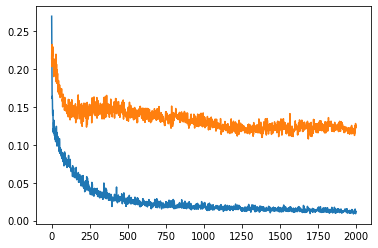

In [61]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [62]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = gru_aadt_norm_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [63]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.006146250326676719


# Make predictions based on test set and get a root mean squared error 

In [64]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = gru_aadt_norm_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [65]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.18385379916379488


# Plot train labels along with train predictions

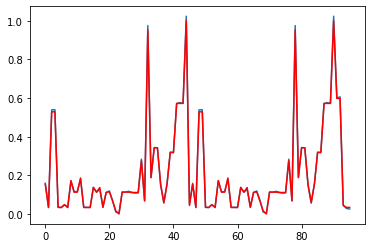

In [66]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

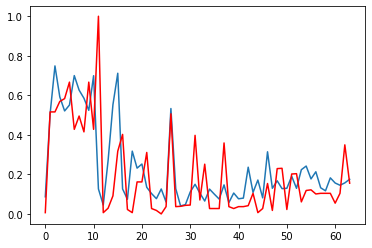

In [67]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()